In [1]:
!nvidia-smi

Wed Feb 19 10:51:41 2025       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 545.29.06              Driver Version: 545.29.06    CUDA Version: 12.3     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  NVIDIA GeForce RTX 3090        Off | 00000000:19:00.0 Off |                  N/A |
|  0%   22C    P8              22W / 350W |   5243MiB / 24576MiB |      0%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

In [2]:
import numpy as np
import math
import matplotlib.pyplot as plt
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.autograd as autograd
import torch.optim as optim
from torch.nn.parameter import Parameter
from torch import Tensor
from pyDOE import lhs
from function_facc2 import *

import os
os.environ["CUDA_DEVICE_ORDER"] = "PCI_BUS_ID"
os.environ["CUDA_VISIBLE_DEVICES"] = "1"

device = torch.device('cuda:0' if torch.cuda.is_available() else ' cpu')
print(device)

cuda:0


In [3]:
import random
import numpy as np
import torch

seed = 2021
deterministic = True

random.seed(seed)
np.random.seed(seed)
torch.manual_seed(seed)
torch.cuda.manual_seed_all(seed)
if deterministic:
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False

In [4]:
rho = 1 # density
mu = 0.01 # viscosity
k_fluid = 0.1 # thermal conductivity
inlet = 1
temp = 10
k_solid = 10 
cp = 50 # specific heat capacity
thermal_diffusivity = k_fluid / (rho * cp)
k_mu = mu / rho # kinematic viscosity

density_surface = 20000 # 단위 면적당 개수
density_line =  1000
'Fourier Feature'
scale = np.linspace(3, 3, 1)
mapping_size = 128
FF = True

'''
'domain_fluid': 0, 'bc_fluid_top': 1, 'bc_fluid_bottom': 2, 'bc_fluid_left': 3, 'bc_fluid_right': 4
'''
#mapping_size * len(scale) * 2
m_layers1 = [mapping_size * len(scale) * 2, 512, 512, 512, 512, 512, 4]
m_layers2 = [mapping_size * len(scale) * 2, 512, 512, 512, 512, 512, 1]

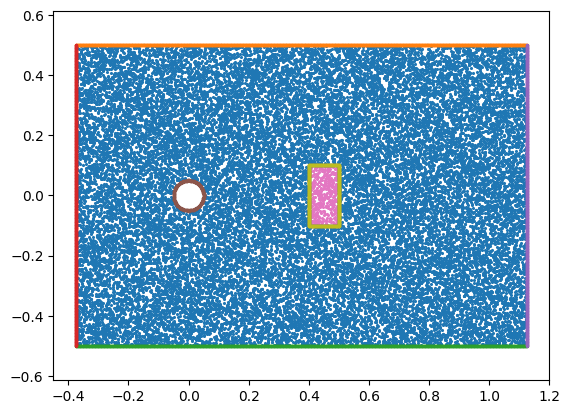

(36355, 3)


In [5]:
collocation_points = COLLOCATION_POINTS(density_surface, density_line)
print(collocation_points.shape)

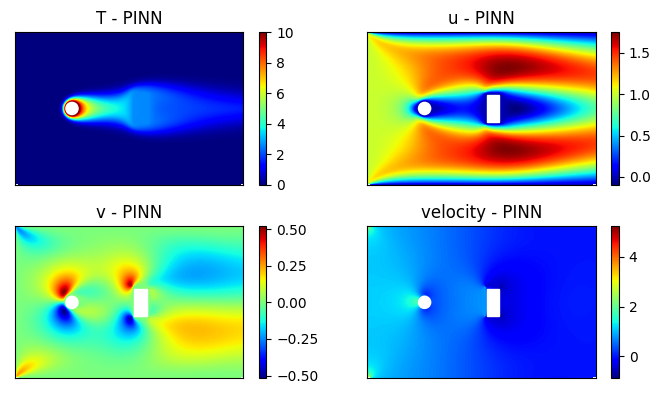

In [6]:
import scipy.interpolate
import matplotlib.patches as patches

cor_fluid = np.loadtxt("./CFD/mu_01_50/xy_cor_fluid.txt")
cor_saga = np.loadtxt("./CFD/mu_01_50/xy_cor_saga.txt")
# cor[:, 0] = cor[:, 0] - 0.5
# cor[:, 1] = cor[:, 1] - 0.5

u_fluid = np.loadtxt("./CFD/mu_01_50/u_fluid.txt")
v_fluid = np.loadtxt("./CFD/mu_01_50/v_fluid.txt")
p_fluid = np.loadtxt("./CFD/mu_01_50/p_fluid.txt")
T_fluid = np.loadtxt("./CFD/mu_01_50/T_fluid.txt") - 273.15
T_saga = np.loadtxt("./CFD/mu_01_50/T_saga.txt") - 273.15

u_fluid_max, u_fluid_min = np.max(u_fluid), np.min(u_fluid)
v_fluid_max, v_fluid_min = np.max(v_fluid), np.min(v_fluid)
p_fluid_max, p_fluid_min = np.max(p_fluid), np.min(p_fluid)
T_fluid_max, T_fluid_min = np.max(T_fluid), np.min(T_fluid)
T_saga_max, T_saga_min = np.max(T_saga), np.min(T_saga)

vel_CFD = np.sqrt(u_fluid**2 + v_fluid**2)
vel_CFD_max = np.max(vel_CFD)
vel_CFD_min = np.min(vel_CFD)

CFD_results_fluid = np.vstack([u_fluid, v_fluid, p_fluid, T_fluid]).T
CFD_results_saga = T_saga.reshape(-1 ,1)

def interpolate_output(x, y, us, extent):
    "Interpolates irregular points onto a mesh"

    # define mesh to interpolate onto
    xyi = np.meshgrid(
        np.linspace(extent[0], extent[1], 500),
        np.linspace(extent[2], extent[3], 500),
        indexing="ij",
    )

    # linearly interpolate points onto mesh
    us = [scipy.interpolate.griddata(
        (x, y), u, tuple(xyi)
        )
        for u in us]

    return us

def plot(cor_fluid, cor_saga):
    x, y = cor_fluid[:, 0], cor_fluid[:, 1]

    T_inter, u_inter, v_inter, p_inter = interpolate_output(x, y,
                                                           [T_fluid.reshape(-1, 1), u_fluid.reshape(-1, 1), v_fluid.reshape(-1, 1), p_fluid.reshape(-1, 1)],
                                                           [-0.375, 1.125, -0.5, 0.5],
    )

    T_inter = T_inter.squeeze(axis=2)
    u_inter = u_inter.squeeze(axis=2)
    v_inter = v_inter.squeeze(axis=2)
    p_inter = p_inter.squeeze(axis=2)
    
    plt.figure(figsize=(7, 4))
    plt.subplot(2, 2, 1)
    plt.title('T - PINN')
    plt.imshow(T_inter.T, origin="lower", extent=[-0.375, 1.125, -0.5, 0.5], vmin=0, vmax=10, cmap='jet')
    shp=patches.Circle((0, 0), radius=0.04, color='white')
    plt.gca().add_patch(shp)
    plt.colorbar()
    plt.gca().axes.xaxis.set_visible(False)
    plt.gca().axes.yaxis.set_visible(False)

    plt.subplot(2, 2, 2)
    plt.title('u - PINN')
    plt.imshow(u_inter.T, origin="lower", extent=[-0.375, 1.125, -0.5, 0.5], vmin=u_fluid_min, vmax=u_fluid_max, cmap='jet')
    shp=patches.Circle((0, 0), radius=0.04, color='white')
    plt.gca().add_patch(shp)
    shp=patches.Rectangle((0.41, -0.09), 0.08, 0.18, color='white')
    plt.gca().add_patch(shp)
    plt.colorbar()
    plt.gca().axes.xaxis.set_visible(False)
    plt.gca().axes.yaxis.set_visible(False)

    plt.subplot(2, 2, 3)
    plt.title('v - PINN')
    plt.imshow(v_inter.T, origin="lower", extent=[-0.375, 1.125, -0.5, 0.5], vmin=v_fluid_min, vmax=v_fluid_max, cmap='jet')
    shp=patches.Circle((0, 0), radius=0.04, color='white')
    plt.gca().add_patch(shp)
    shp=patches.Rectangle((0.41, -0.09), 0.08, 0.18, color='white')
    plt.gca().add_patch(shp)
    plt.colorbar()
    plt.gca().axes.xaxis.set_visible(False)
    plt.gca().axes.yaxis.set_visible(False)

    plt.subplot(2, 2, 4)
    plt.title('velocity - PINN')
    plt.imshow(p_inter.T, origin="lower", extent=[-0.375, 1.125, -0.5, 0.5], vmin=p_fluid_min, vmax=p_fluid_max, cmap='jet')
    shp=patches.Circle((0, 0), radius=0.04, color='white')
    plt.gca().add_patch(shp)
    shp=patches.Rectangle((0.41, -0.09), 0.08, 0.18, color='white')
    plt.gca().add_patch(shp)
    plt.colorbar()
    plt.gca().axes.xaxis.set_visible(False)
    plt.gca().axes.yaxis.set_visible(False)
    plt.tight_layout()
    # plt.savefig('./image/facc_pinn_v4_01_50/facc_pinn_v4.png'.format(epoch),format='png', dpi=100, bbox_inches='tight', pad_inches=0)
    plt.show()

plot(cor_fluid, cor_saga)

In [7]:
def PDE_F(model, collocation_points):
    X = collocation_points.copy()
    X = torch.tensor(X, requires_grad=True)
    
    idx_domain_fluid = np.where(X[:, 0] == 0)
    colp_domain_fluid = X[idx_domain_fluid][:, 1:].to(device)
    Domain_fluid = model(colp_domain_fluid)
    
    u = Domain_fluid[:, 0]
    v = Domain_fluid[:, 1]
    p = Domain_fluid[:, 2]
    T = Domain_fluid[:, 3]

    u_x_y = autograd.grad(u, colp_domain_fluid, torch.ones(u.shape).to(device), retain_graph = True, create_graph = True)[0]
    du_x = u_x_y[:, [0]]
    du_y = u_x_y[:, [1]]
    
    u_xx_xy = autograd.grad(du_x, colp_domain_fluid, torch.ones(du_x.shape).to(device), retain_graph = True, create_graph = True)[0]
    u_yx_yy = autograd.grad(du_y, colp_domain_fluid, torch.ones(du_y.shape).to(device), retain_graph = True, create_graph = True)[0]
    
    v_x_y = autograd.grad(v, colp_domain_fluid, torch.ones(v.shape).to(device), retain_graph = True, create_graph = True)[0]
    dv_x = v_x_y[:, [0]]
    dv_y = v_x_y[:, [1]]
    
    v_xx_xy = autograd.grad(dv_x, colp_domain_fluid, torch.ones(dv_x.shape).to(device), create_graph = True)[0]
    v_yx_yy = autograd.grad(dv_y, colp_domain_fluid, torch.ones(dv_y.shape).to(device), create_graph = True)[0]
    
    p_x_y = autograd.grad(p, colp_domain_fluid, torch.ones(p.shape).to(device), create_graph = True)[0]
    
    du_xx = u_xx_xy[:, [0]]
    du_yy = u_yx_yy[:, [1]]
    
    dv_xx = v_xx_xy[:, [0]]
    dv_yy = v_yx_yy[:, [1]]
    
    dp_x = p_x_y[:, [0]]
    dp_y = p_x_y[:, [1]]
    
    ###################### Convection #######################
    T_x_y = autograd.grad(T, colp_domain_fluid, torch.ones(T.shape).to(device), retain_graph=True, create_graph=True)[0]
    dT_x = T_x_y[:, 0:1]
    dT_y = T_x_y[:, 1:2]
    
    T_xx_xy = autograd.grad(dT_x, colp_domain_fluid, torch.ones(dT_x.shape).to(device), retain_graph=True, create_graph=True)[0]
    dT_xx = T_xx_xy[:, 0:1]
    
    T_yx_yy = autograd.grad(dT_y, colp_domain_fluid, torch.ones(dT_y.shape).to(device), retain_graph=True, create_graph=True)[0]
    dT_yy = T_yx_yy[:, 1:2]
    
    u = u.reshape(-1, 1)
    v = v.reshape(-1, 1)

    pde_u = rho * (u * du_x + v * du_y) + dp_x - mu * (du_xx + du_yy)
    pde_v = rho * (u * dv_x + v * dv_y) + dp_y - mu * (dv_xx + dv_yy)
    pde_cont = du_x + dv_y
    
    pde_t = (u * dT_x + v * dT_y) - thermal_diffusivity * dT_yy - (k_mu/cp) * du_y**2
    
    return [pde_u.float(), pde_v.float(),  pde_cont.float(), pde_t.float()]

def PDE_S(model, collocation_points):
    X = collocation_points.copy()
    X = torch.tensor(X, requires_grad=True)
    
    idx_domain_solid = np.where(X[:, 0] == 6)[0]
    
    colp_domain_solid = X[idx_domain_solid][:, 1:].to(device)
    
    Domain_solid = model(colp_domain_solid)
    
    T = Domain_solid[:, 0:1]
                    
    T_x_y = torch.autograd.grad(T, colp_domain_solid, torch.ones(T.shape).to(device), retain_graph=True, create_graph=True)[0]
    dT_x = T_x_y[:, 0:1]
    dT_y = T_x_y[:, 1:2]
    
    T_xx_yx = torch.autograd.grad(dT_x, colp_domain_solid, torch.ones(dT_x.shape).to(device), retain_graph=True, create_graph=True)[0]
    dT_xx = T_xx_yx[:, 0:1]
    
    T_xy_yy = torch.autograd.grad(dT_y, colp_domain_solid, torch.ones(dT_y.shape).to(device), retain_graph=True, create_graph=True)[0]
    dT_yy = T_xy_yy[:, 1:2]
                    
    pde_t = k_solid * (dT_xx + dT_yy)
                    
    return [pde_t.float()]

def BC(model, collocation_points, inlet):
    X = collocation_points.copy()
    X = torch.tensor(X, requires_grad=True)
    idx_bc_top = np.where(X[:, 0] == 1)
    idx_bc_bottom = np.where(X[:, 0] == 2)
    idx_bc_left = np.where(X[:, 0] == 3)
    idx_bc_right = np.where(X[:, 0] == 4)
    idx_bc_cylinder = np.where(X[:, 0] == 5)
    idx_bc_saga = np.where(X[:, 0] == 7)
    colp_bc = X[:, 1:].to(device)
    colp_bc_right = X[idx_bc_right][:, 1:].to(device)
    
    BC_top = model(colp_bc[idx_bc_top])[:, 0:2]
    BC_top_T = model(colp_bc[idx_bc_top])[:, 3]
    BC_bottom = model(colp_bc[idx_bc_bottom])[:, 0:2]
    BC_bottom_T = model(colp_bc[idx_bc_bottom])[:, 3]
    BC_left_u = model(colp_bc[idx_bc_left])[:, 0] - torch.ones_like(model(colp_bc[idx_bc_left])[:, 0]) * inlet
    BC_left_v = model(colp_bc[idx_bc_left])[:, 1]
    BC_left_T = model(colp_bc[idx_bc_left])[:, 3]
    
    BC_right = model(colp_bc[idx_bc_right])[:, 2] 
    Tr = model(colp_bc_right)[:, 3]
    Tr_x_y = autograd.grad(Tr, colp_bc_right, torch.ones(Tr.shape).to(device), retain_graph=True, create_graph=True)[0]
    BC_right_dT_x = Tr_x_y[:, 0:1]
    
    BC_cylinder = model(colp_bc[idx_bc_cylinder])[:, 0:2]
    BC_cylinder_T = model(colp_bc[idx_bc_cylinder])[:, 3] - torch.ones_like(model(colp_bc[idx_bc_cylinder])[:, 3]) * temp
    
    BC_saga = model(colp_bc[idx_bc_saga])[:, 0:2]
    
    return [BC_top.float(), BC_top_T.float(), BC_bottom.float(), BC_bottom_T.float(), BC_left_u.float(), BC_left_v.float(), 
            BC_left_T.float(), BC_right.float(), BC_right_dT_x.float(), BC_cylinder.float(), BC_cylinder_T.float(), BC_saga.float()]

def SB(model1, model2, collocation_points, index):
    X = collocation_points.copy()
    X = torch.tensor(X, requires_grad=True)
    
    idx_sb_points = np.where(X[:, 0] == 7)[0]
    colp_sb_points = X[idx_sb_points][:, 1:].to(device)
    
    # Sub-Net1, Interface 1
    SB_1i1 = model1(colp_sb_points)
    u = SB_1i1[:, 0:1].detach()
    v = SB_1i1[:, 1:2].detach()
    T1 = SB_1i1[:, 3:4]
    
    T1_x_y = torch.autograd.grad(T1, colp_sb_points, torch.ones(T1.shape).to(device), retain_graph=True, create_graph=True)[0]
    dT1_x = T1_x_y[:, 0:1]
    dT1_y = T1_x_y[:, 1:2]
    
    T1_xx_yx = torch.autograd.grad(dT1_x, colp_sb_points, torch.ones(dT1_x.shape).to(device), retain_graph=True, create_graph=True)[0]
    dT1_xx = T1_xx_yx[:, 0:1]
    
    T1_xy_yy = torch.autograd.grad(dT1_y, colp_sb_points, torch.ones(dT1_y.shape).to(device), retain_graph=True, create_graph=True)[0]
    dT1_yy = T1_xy_yy[:, 1:2]
    
    # Sub-Net2, Interface 2
    SB_2i1 = model2(colp_sb_points)
    T2 = SB_2i1[:, 0:1]
    
    T2_x_y = torch.autograd.grad(T2, colp_sb_points, torch.ones(T2.shape).to(device), retain_graph=True, create_graph=True)[0]
    dT2_x = T2_x_y[:, 0:1]
    dT2_y = T2_x_y[:, 1:2]
    
    T2_xx_yx = torch.autograd.grad(dT2_x, colp_sb_points, torch.ones(dT2_x.shape).to(device), retain_graph=True, create_graph=True)[0]
    dT2_xx = T2_xx_yx[:, 0:1]
    
    T2_xy_yy = torch.autograd.grad(dT2_y, colp_sb_points, torch.ones(dT2_y.shape).to(device), retain_graph=True, create_graph=True)[0]
    dT2_yy = T2_xy_yy[:, 1:2]
    
    if index == 1:
        T2.detach()
        dT2_xx = dT2_xx.detach()
        dT2_yy = dT2_yy.detach()
    else:
        T1 = T1.detach()
        dT1_x = dT1_x.detach()
        dT1_y = dT1_y.detach()
        dT1_xx = dT1_xx.detach()
        dT1_yy = dT1_yy.detach()
    
    # Average value
    Tavgi1 = (T1 + T2)/2
    
    # Residuals
    pde_t1 = (u * dT1_x + v * dT1_y) - thermal_diffusivity * (dT1_xx + dT1_yy)
    pde_t2 = k_solid * (dT2_xx + dT2_yy)
    
    loss_T1i1 = Tavgi1 - T1
    loss_T2i1 = Tavgi1 - T2
    
    return [pde_t1.float(), pde_t2.float(), loss_T1i1.float(), loss_T2i1.float()]
#     return [loss_T1i1.float(), loss_T2i1.float()]

In [8]:
T1_pred_history = []
T2_pred_history = []
u_pred_history = []
v_pred_history = []
p_pred_history = []

In [9]:
def PLOT(model1, model2, col_fluid, col_saga, CFD_fluid, CFD_saga, epoch, history=False):
    X1 = col_fluid.copy()
    X2 = col_saga.copy()
    X1 = torch.tensor(X1, requires_grad=False)
    X2 = torch.tensor(X2, requires_grad=False)
    
    with torch.no_grad():
        model1.eval()
        model2.eval()
        plt.figure(figsize=(7, 5.5))
        test_result1 = model1(X1.to(device))
        test_result2 = model2(X2.to(device))

        u_test = test_result1[:, 0].detach().cpu().numpy().reshape(-1, 1)
        v_test = test_result1[:, 1].detach().cpu().numpy().reshape(-1, 1)
        p_test = test_result1[:, 2].detach().cpu().numpy().reshape(-1, 1)
        T1_test = (test_result1[:, 3].detach().cpu().numpy()).reshape(-1, 1)
        T2_test = (test_result2[:, 0].detach().cpu().numpy()).reshape(-1, 1)
        
        u_GT = CFD_fluid[:, 0].reshape(-1, 1)
        v_GT = CFD_fluid[:, 1].reshape(-1, 1)
        p_GT = CFD_fluid[:, 2].reshape(-1, 1)
        T1_GT = CFD_fluid[:, 3].reshape(-1, 1)
        T2_GT = CFD_saga[:, 0].reshape(-1, 1)
        
        x1, y1 = X1[:, 0], X1[:, 1]
        x2, y2 = X2[:, 0], X2[:, 1]

        T1_CFD, u_CFD, v_CFD, p_CFD = interpolate_output(x1, y1,
                                                        [T1_GT, u_GT, v_GT, p_GT],
                                                        [-0.375, 1.125, -0.5, 0.5],
        )

        T2_CFD = interpolate_output(x2, y2,
                                    [T2_GT],
                                    [-0.375, 1.125, -0.5, 0.5])
        
        T1_pred, u_pred, v_pred, p_pred = interpolate_output(x1, y1,
                                                            [T1_test, u_test, v_test, p_test],
                                                            [-0.375, 1.125, -0.5, 0.5],
        )
        T2_pred = interpolate_output(x2, y2,
                                     [T2_test],
                                     [-0.375, 1.125, -0.5, 0.5])
        
        T1_error, u_error, v_error, p_error = interpolate_output(x1, y1,
                                                                [abs(T1_test - T1_GT), abs(u_test - u_GT), abs(v_test - v_GT), abs(p_test - p_GT)],
                                                                [-0.375, 1.125, -0.5, 0.5],
        )
        T2_error = interpolate_output(x2, y2,
                                     [abs(T2_test - T2_GT)],
                                     [-0.375, 1.125, -0.5, 0.5])
        
        T1_CFD = T1_CFD.squeeze(axis=2)
        u_CFD = u_CFD.squeeze(axis=2)
        v_CFD = v_CFD.squeeze(axis=2)
        p_CFD = p_CFD.squeeze(axis=2)
        T2_CFD = T2_CFD[0].squeeze(axis=2)
        
        T1_pred = T1_pred.squeeze(axis=2)
        u_pred = u_pred.squeeze(axis=2)
        v_pred = v_pred.squeeze(axis=2)
        p_pred = p_pred.squeeze(axis=2)
        T2_pred = T2_pred[0].squeeze(axis=2)
        
        T1_error = T1_error.squeeze(axis=2)
        u_error = u_error.squeeze(axis=2)
        v_error = v_error.squeeze(axis=2)
        p_error = p_error.squeeze(axis=2)
        T2_error = T2_error[0].squeeze(axis=2)
        
        plt.subplot(4, 3, 1)
        plt.title('CFD: T')
        plt.imshow(T1_CFD.T, origin="lower", extent=[-0.375, 1.125, -0.5, 0.5], vmin=0, vmax=10, cmap='jet')
        plt.imshow(T2_CFD.T, origin="lower", extent=[-0.375, 1.125, -0.5, 0.5], vmin=0, vmax=10, cmap='jet')
        shp=patches.Circle((0, 0), radius=0.04, color='white')
        plt.gca().add_patch(shp)
        plt.colorbar()
        plt.gca().axes.xaxis.set_visible(False)
        plt.gca().axes.yaxis.set_visible(False)
        
        plt.subplot(4, 3, 2)
        plt.title('X-PINN: T')
        plt.imshow(T1_pred.T, origin="lower", extent=[-0.375, 1.125, -0.5, 0.5], vmin=0, vmax=10, cmap='jet')
        plt.imshow(T2_pred.T, origin="lower", extent=[-0.375, 1.125, -0.5, 0.5], vmin=0, vmax=10, cmap='jet')
        shp=patches.Circle((0, 0), radius=0.04, color='white')
        plt.gca().add_patch(shp)
        plt.colorbar()
        plt.gca().axes.xaxis.set_visible(False)
        plt.gca().axes.yaxis.set_visible(False)
        
        plt.subplot(4, 3, 3)
        plt.title('Error: T')
        plt.imshow(T1_error.T, origin="lower", extent=[-0.375, 1.125, -0.5, 0.5], vmin=0, vmax=2, cmap='jet')
        plt.imshow(T2_error.T, origin="lower", extent=[-0.375, 1.125, -0.5, 0.5], vmin=0, vmax=2, cmap='jet')
        shp=patches.Circle((0, 0), radius=0.04, color='white')
        plt.gca().add_patch(shp)
        plt.colorbar()
        plt.gca().axes.xaxis.set_visible(False)
        plt.gca().axes.yaxis.set_visible(False)
        
        plt.subplot(4, 3, 4)
        plt.title('CFD: u')
        plt.imshow(u_CFD.T, origin="lower", extent=[-0.375, 1.125, -0.5, 0.5], vmin=u_fluid_min, vmax=u_fluid_max, cmap='jet')
        shp=patches.Circle((0, 0), radius=0.04, color='white')
        plt.gca().add_patch(shp)
        shp=patches.Rectangle((0.41, -0.09), 0.08, 0.18, color='white')
        plt.gca().add_patch(shp)
        plt.colorbar()
        plt.gca().axes.xaxis.set_visible(False)
        plt.gca().axes.yaxis.set_visible(False)
        
        plt.subplot(4, 3, 5)
        plt.title('X-PINN: u')
        plt.imshow(u_pred.T, origin="lower", extent=[-0.375, 1.125, -0.5, 0.5], vmin=u_fluid_min, vmax=u_fluid_max, cmap='jet')
        shp=patches.Circle((0, 0), radius=0.04, color='white')
        plt.gca().add_patch(shp)
        shp=patches.Rectangle((0.41, -0.09), 0.08, 0.18, color='white')
        plt.gca().add_patch(shp)
        plt.colorbar()
        plt.gca().axes.xaxis.set_visible(False)
        plt.gca().axes.yaxis.set_visible(False)
        
        plt.subplot(4, 3, 6)
        plt.title('Error: u')
        plt.imshow(u_error.T, origin="lower", extent=[-0.375, 1.125, -0.5, 0.5], vmin=0, vmax=0.2 * u_fluid_max, cmap='jet')
        shp=patches.Circle((0, 0), radius=0.04, color='white')
        plt.gca().add_patch(shp)
        shp=patches.Rectangle((0.41, -0.09), 0.08, 0.18, color='white')
        plt.gca().add_patch(shp)
        plt.colorbar()
        plt.gca().axes.xaxis.set_visible(False)
        plt.gca().axes.yaxis.set_visible(False)
               
        plt.subplot(4, 3, 7)
        plt.title('CFD: v')
        plt.imshow(v_CFD.T, origin="lower", extent=[-0.375, 1.125, -0.5, 0.5], vmin=v_fluid_min, vmax=v_fluid_max, cmap='jet')
        shp=patches.Circle((0, 0), radius=0.04, color='white')
        plt.gca().add_patch(shp)
        shp=patches.Rectangle((0.41, -0.09), 0.08, 0.18, color='white')
        plt.gca().add_patch(shp)
        plt.colorbar()
        plt.gca().axes.xaxis.set_visible(False)
        plt.gca().axes.yaxis.set_visible(False)
                  
        plt.subplot(4, 3, 8)
        plt.title('X-PINN: v')
        plt.imshow(v_pred.T, origin="lower", extent=[-0.375, 1.125, -0.5, 0.5], vmin=v_fluid_min, vmax=v_fluid_max, cmap='jet')
        shp=patches.Circle((0, 0), radius=0.04, color='white')
        plt.gca().add_patch(shp)
        shp=patches.Rectangle((0.41, -0.09), 0.08, 0.18, color='white')
        plt.gca().add_patch(shp)
        plt.colorbar()
        plt.gca().axes.xaxis.set_visible(False)
        plt.gca().axes.yaxis.set_visible(False)
                  
        plt.subplot(4, 3, 9)
        plt.title('Error: v')
        plt.imshow(v_error.T, origin="lower", extent=[-0.375, 1.125, -0.5, 0.5], vmin=0, vmax=0.2 * v_fluid_max, cmap='jet')
        shp=patches.Circle((0, 0), radius=0.04, color='white')
        plt.gca().add_patch(shp)
        shp=patches.Rectangle((0.41, -0.09), 0.08, 0.18, color='white')
        plt.gca().add_patch(shp)
        plt.colorbar()
        plt.gca().axes.xaxis.set_visible(False)
        plt.gca().axes.yaxis.set_visible(False)
        
        plt.subplot(4, 3, 10)
        plt.title('CFD: p')
        plt.imshow(p_CFD.T, origin="lower", extent=[-0.375, 1.125, -0.5, 0.5], vmin=p_fluid_min, vmax=p_fluid_max, cmap='jet')
        shp=patches.Circle((0, 0), radius=0.04, color='white')
        plt.gca().add_patch(shp)
        shp=patches.Rectangle((0.41, -0.09), 0.08, 0.18, color='white')
        plt.gca().add_patch(shp)
        plt.colorbar()
        plt.gca().axes.xaxis.set_visible(False)
        plt.gca().axes.yaxis.set_visible(False)
                  
        plt.subplot(4, 3, 11)
        plt.title('X-PINN: p')
        plt.imshow(p_pred.T, origin="lower", extent=[-0.375, 1.125, -0.5, 0.5], vmin=p_fluid_min, vmax=p_fluid_max, cmap='jet')
        shp=patches.Circle((0, 0), radius=0.04, color='white')
        plt.gca().add_patch(shp)
        shp=patches.Rectangle((0.41, -0.09), 0.08, 0.18, color='white')
        plt.gca().add_patch(shp)
        plt.colorbar()
        plt.gca().axes.xaxis.set_visible(False)
        plt.gca().axes.yaxis.set_visible(False)
                  
        plt.subplot(4, 3, 12)
        plt.title('Error: p')
        plt.imshow(p_error.T, origin="lower", extent=[-0.375, 1.125, -0.5, 0.5], vmin=0, vmax=0.2 * p_fluid_max, cmap='jet')
        shp=patches.Circle((0, 0), radius=0.04, color='white')
        plt.gca().add_patch(shp)
        shp=patches.Rectangle((0.41, -0.09), 0.08, 0.18, color='white')
        plt.gca().add_patch(shp)
        plt.colorbar()
        plt.gca().axes.xaxis.set_visible(False)
        plt.gca().axes.yaxis.set_visible(False)
        plt.tight_layout()
        plt.savefig('./image/facc_pinn_v5_01/facc_pinn_v5_5_{0:06d}.png'.format(epoch),format='png', dpi=100, bbox_inches='tight', pad_inches=0)
        plt.show()
        
        plt.close()

    if history==True:
        plt.plot(loss_record, label='total')
        plt.yscale("log")
        plt.legend()
        plt.show()
    model1.train()
    model2.train()

In [10]:
class MODEL(nn.Module):
    def __init__(self, layers, mapping_size, scale, FF = False):
        super().__init__()
        
        self.FF = FF
        self.FourierFeature = GauossianFourierFeatureTransform_1D(2, mapping_size, scale)
        
        'activation function'
        self.activation = nn.Tanh()
        
        self.layers = layers
        'initialize neural network as a list using nn.Modulelist'
        self.linears = nn.ModuleList([nn.Linear(layers[i], layers[i + 1]) for i in range(len(layers) - 1)])
        
        self.iter = 0
        
        'Xavier Normal initialization'
        for i in range(len(layers) - 1):
            nn.init.xavier_normal_(self.linears[i].weight.data, gain = 1.0) # weight from a normal distribution with recommanded gain value
            nn.init.zeros_(self.linears[i].bias.data) # set biases to zero
            
    def forward(self, x):
        if torch.is_tensor(x) != True:
            print('Input is not tensor')
        
        a = x.float()
        
        if self.FF == True:
            
            a = self.FourierFeature(a)
        
        for i in range(len(self.layers) - 2):
            z = self.linears[i](a)
            a = self.activation(z)
        
        a = self.linears[-1](a)
        
        return a

In [15]:
'Fourier Feature'
scale = np.linspace(3, 3, 1)
mapping_size = 128
FF = True

'''
'domain_fluid': 0, 'bc_fluid_top': 1, 'bc_fluid_bottom': 2, 'bc_fluid_left': 3, 'bc_fluid_right': 4
'''
FF = True
m_layers1 = [(mapping_size * len(scale) * 2) * FF + (1 - FF) * 2, 650, 650, 650, 650, 650, 4]
model1 = MODEL(m_layers1, mapping_size, scale, FF).to(device)

FF = False
m_layers2 = [(mapping_size * len(scale) * 2) * FF + (1 - FF) * 2, 650, 650, 650, 650, 650, 1]
model2 = MODEL(m_layers2, mapping_size, scale, FF).to(device)

optimizer1 = torch.optim.Adam(model1.parameters(), lr=5e-5)
optimizer2 = torch.optim.Adam(model2.parameters(), lr=5e-5)
Loss_func = nn.MSELoss(reduction='mean')
max_loss = np.inf
max_loss1 = np.inf
max_loss2 = np.inf

In [16]:
total_params = 0

model_list = [model1, model2]

for model in model_list:
    for name, param in model.named_parameters():
        if param.requires_grad:
            param_count = param.numel()
            total_params += param_count

# 총 파라미터 수 추가
print("Model Parameter Count {}".format(total_params))

Model Parameter Count 3557455


In [12]:
epoch = 0
Loss_pde_for = 0
Loss_bc_for = 0
cor = collocation_points[:, 1:]

Epoch: 0 Loss: 1149.44367178 Loss1: 648.37628174 Loss2: 0.07758196


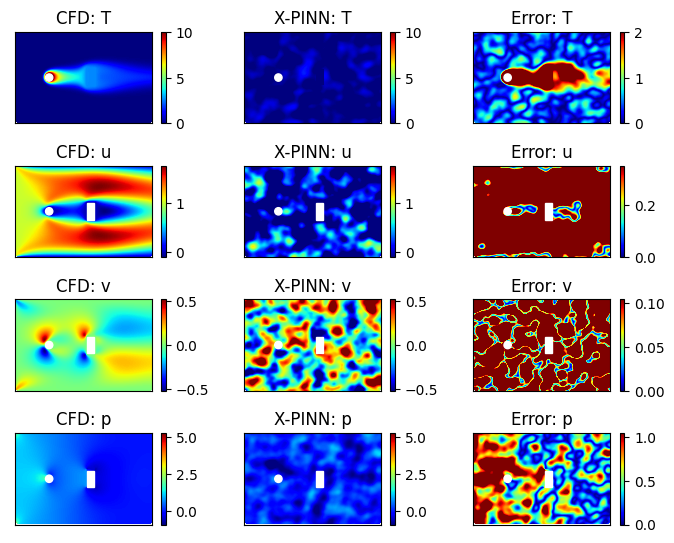

Epoch: 500 Loss: 2.25185610 Loss1: 1.12988305 Loss2: 0.00118638


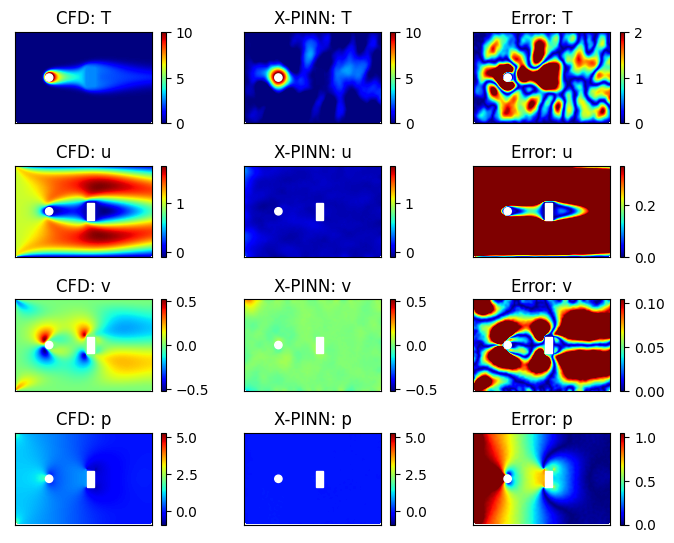

Epoch: 1000 Loss: 1.28823568 Loss1: 0.64331913 Loss2: 0.00044940


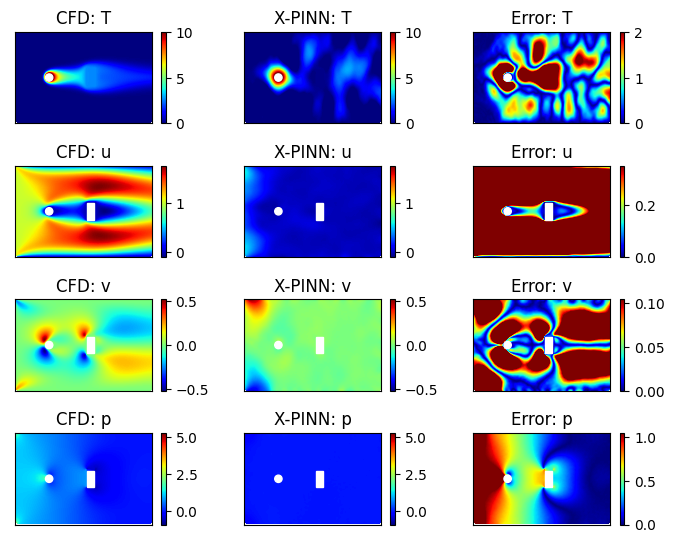

Epoch: 1500 Loss: 0.88286547 Loss1: 0.44145364 Loss2: 0.00026329


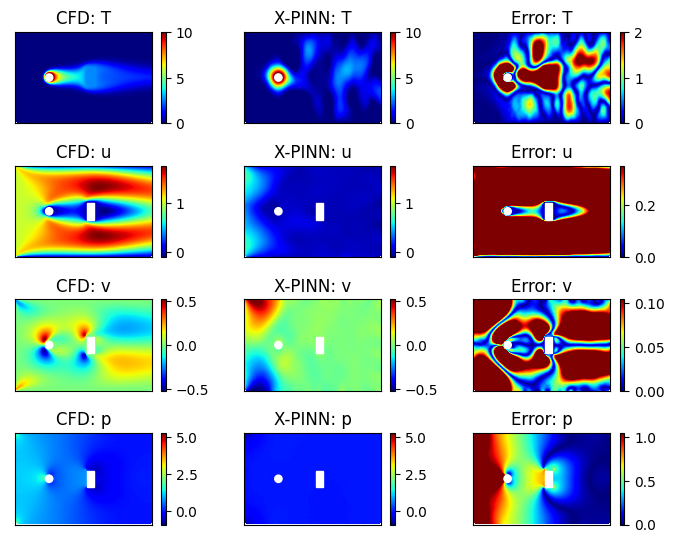

Epoch: 2000 Loss: 0.71375438 Loss1: 0.35539174 Loss2: 0.00013080


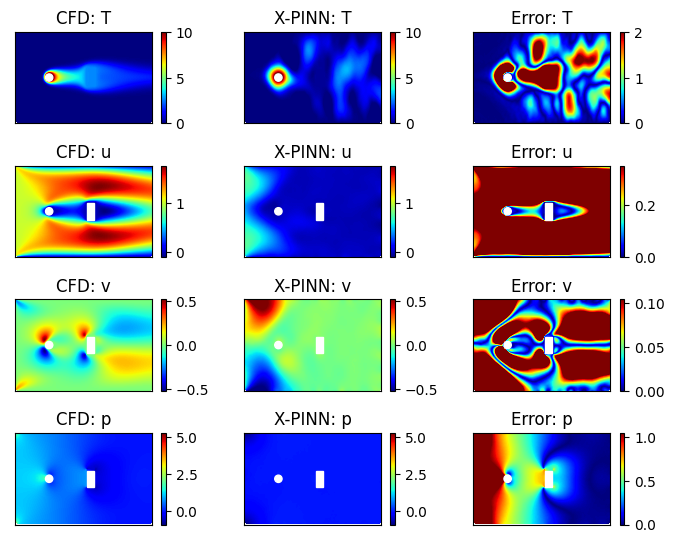

Epoch: 2500 Loss: 0.72290570 Loss1: 0.36210907 Loss2: 0.00009084


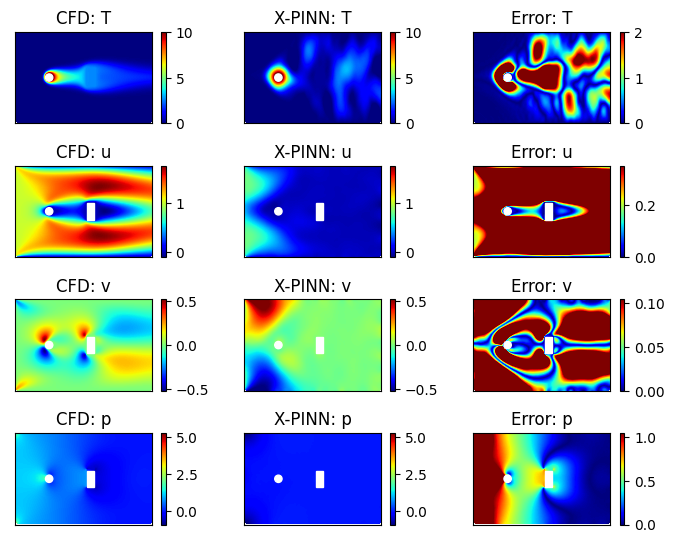

Epoch: 3000 Loss: 0.67527717 Loss1: 0.32815883 Loss2: 0.00006744


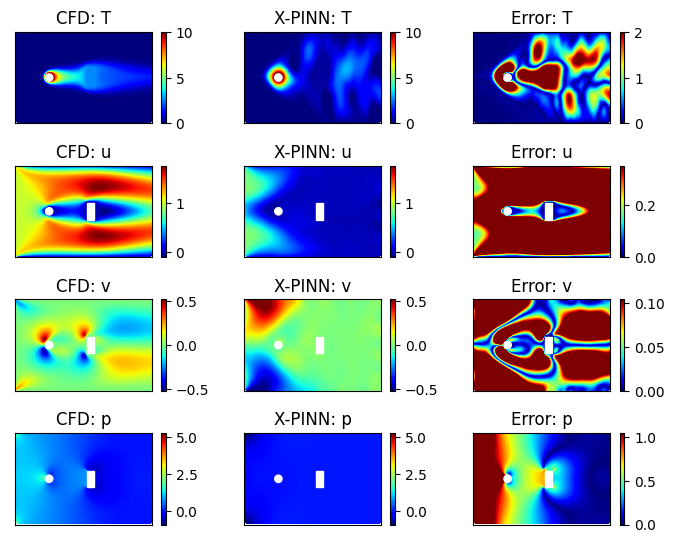

Epoch: 3500 Loss: 0.61781435 Loss1: 0.30359718 Loss2: 0.00007464


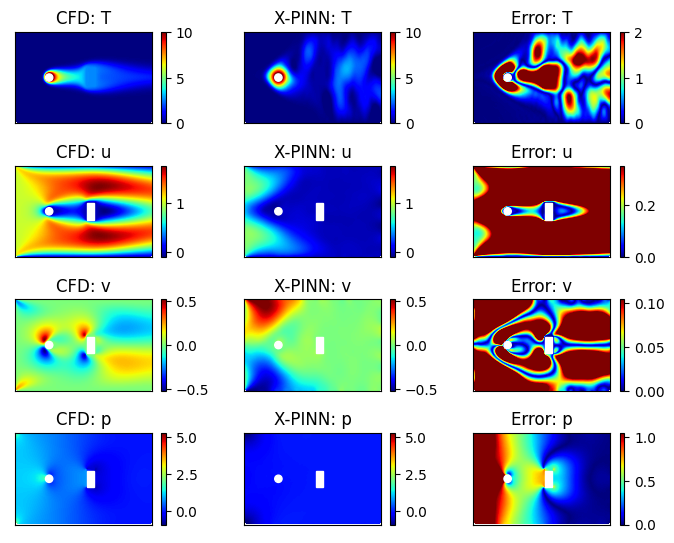

Epoch: 4000 Loss: 0.57522487 Loss1: 0.28942606 Loss2: 0.00007953


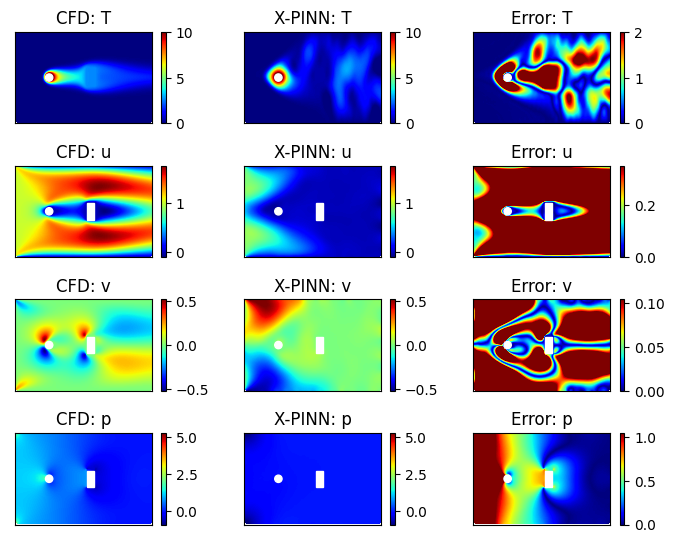

Epoch: 4500 Loss: 0.47976764 Loss1: 0.23981583 Loss2: 0.00006934


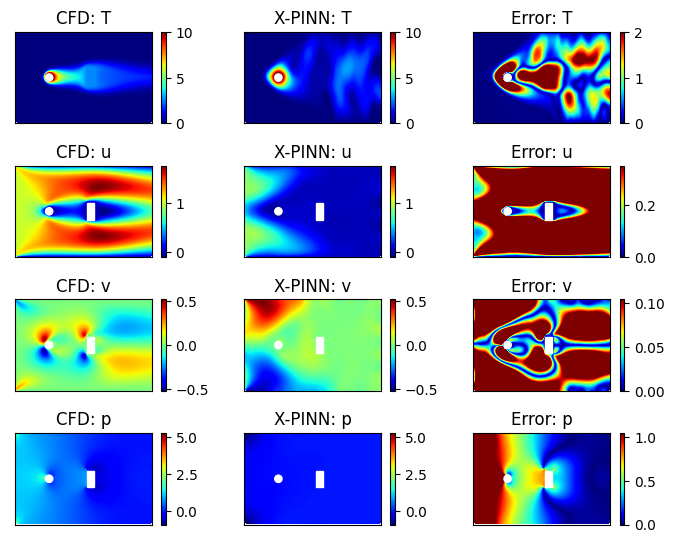

Epoch: 5000 Loss: 0.44443718 Loss1: 0.22232030 Loss2: 0.00006635


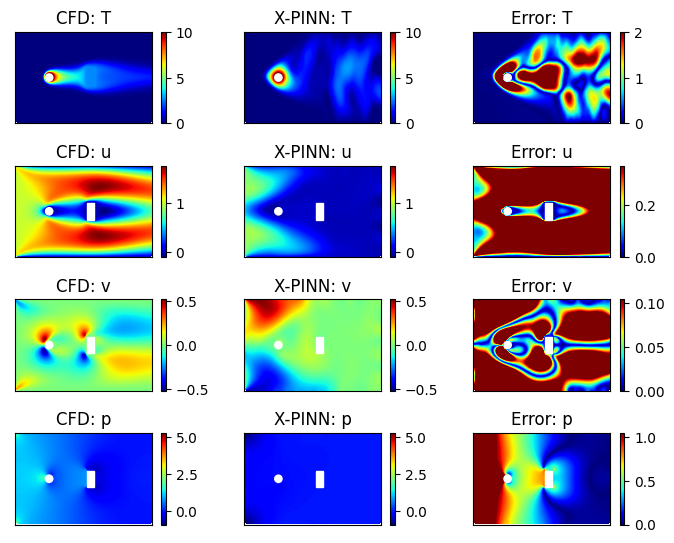

Epoch: 5500 Loss: 0.45306885 Loss1: 0.22388734 Loss2: 0.00006416


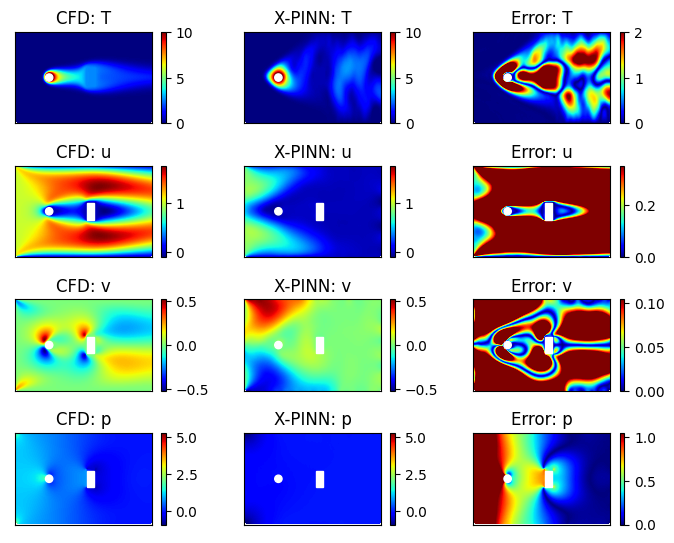

Epoch: 6000 Loss: 0.51509678 Loss1: 0.25280440 Loss2: 0.00005218


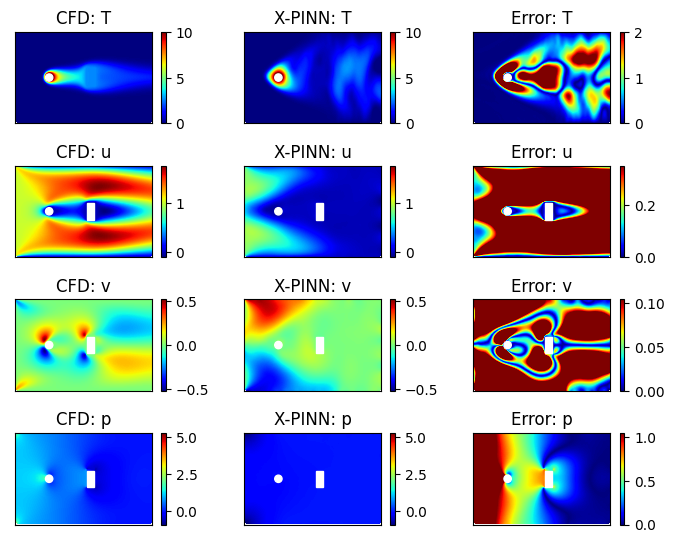

Epoch: 6500 Loss: 0.44082760 Loss1: 0.21958235 Loss2: 0.00003811


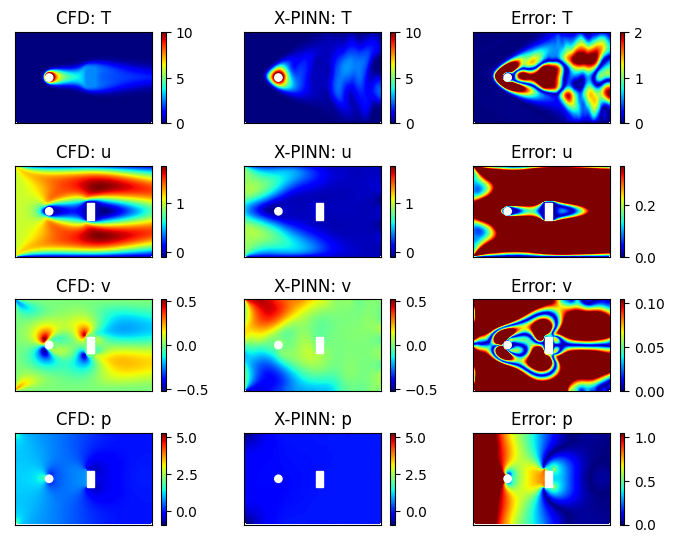

Epoch: 7000 Loss: 0.39855114 Loss1: 0.19860095 Loss2: 0.00003086


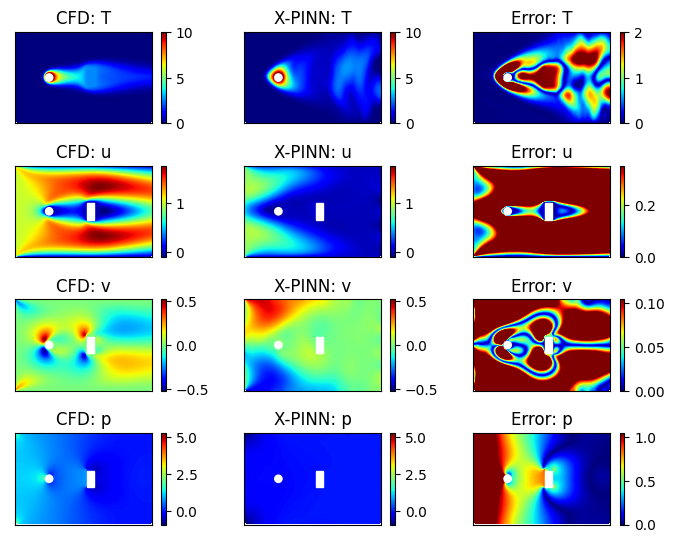

Epoch: 7500 Loss: 0.42817959 Loss1: 0.21632202 Loss2: 0.00003767


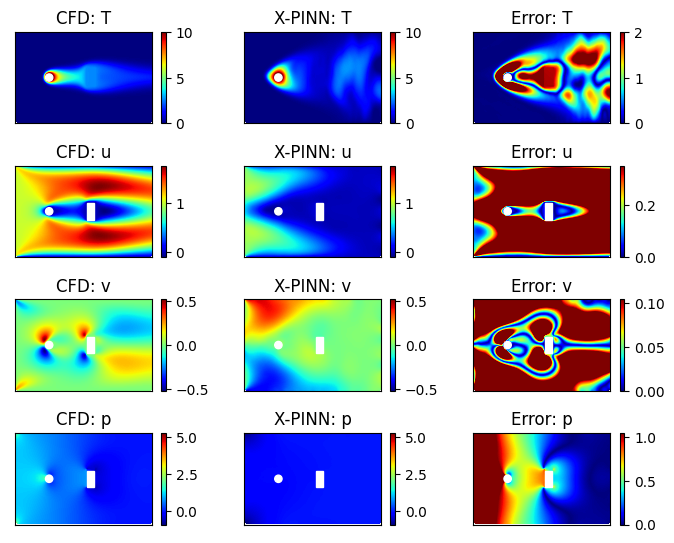

Epoch: 8000 Loss: 0.42272801 Loss1: 0.21433318 Loss2: 0.00004957


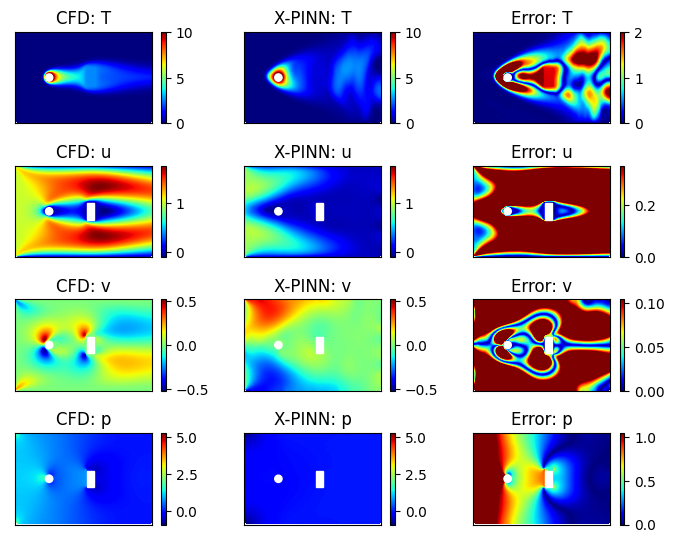

Epoch: 8500 Loss: 0.41850793 Loss1: 0.20705095 Loss2: 0.00004746


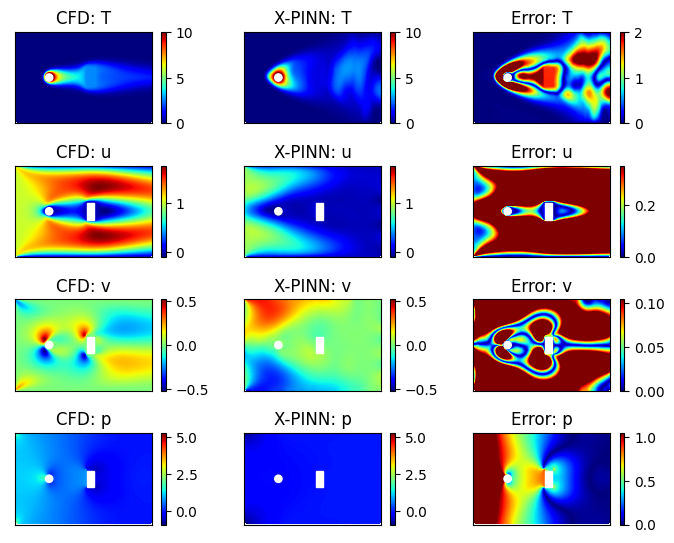

Epoch: 9000 Loss: 0.38161076 Loss1: 0.19016300 Loss2: 0.00005920


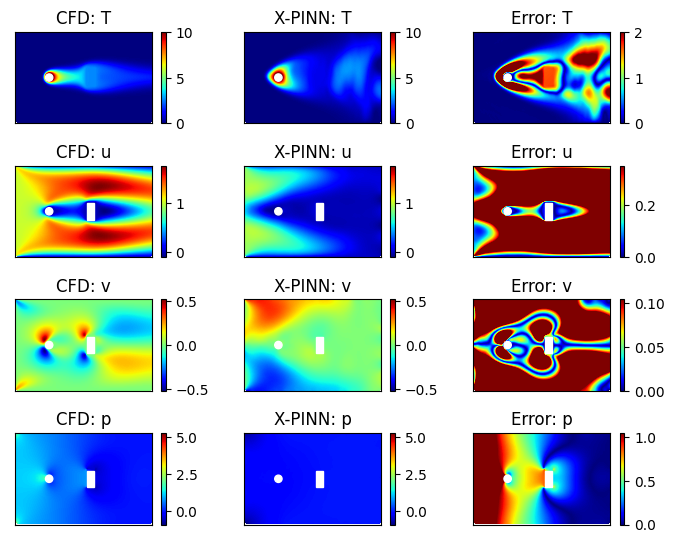

Epoch: 9500 Loss: 0.36562415 Loss1: 0.17858709 Loss2: 0.00005303


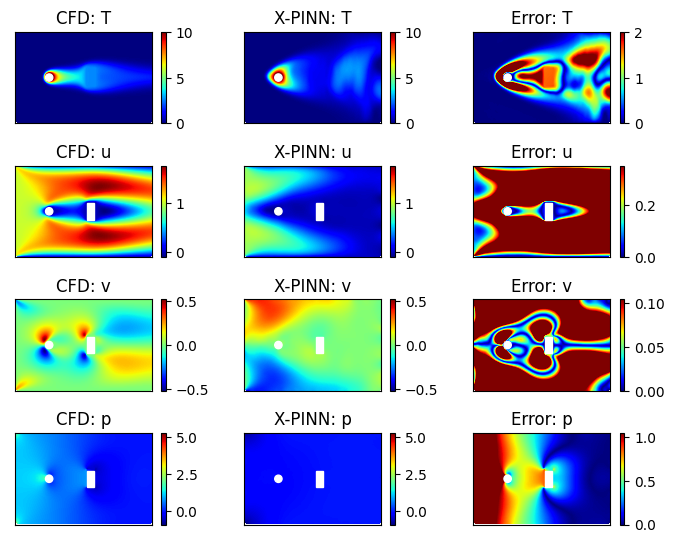

Epoch: 10000 Loss: 0.39883423 Loss1: 0.20621893 Loss2: 0.00006924


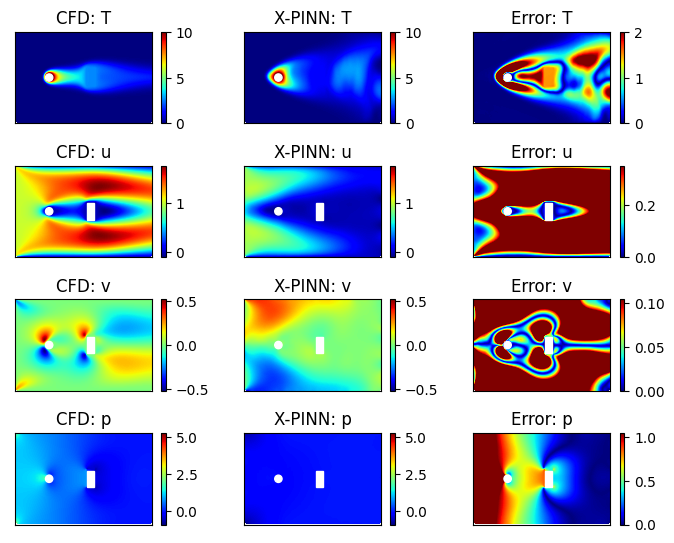

Epoch: 10500 Loss: 0.35373179 Loss1: 0.17625380 Loss2: 0.00005313


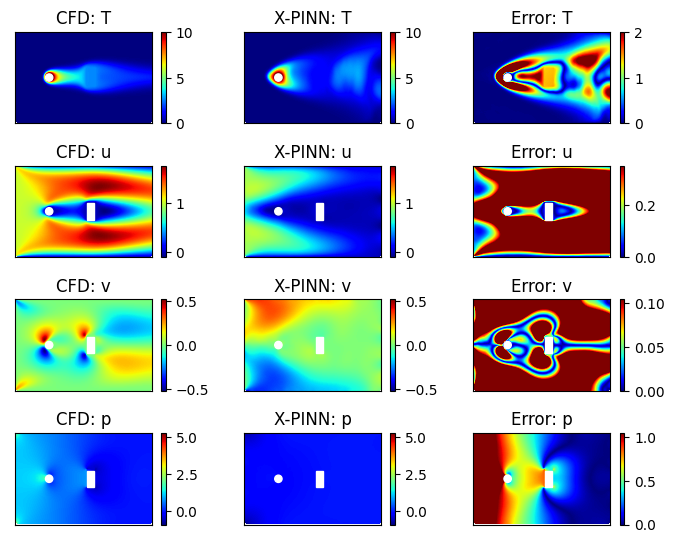

Epoch: 11000 Loss: 0.36131166 Loss1: 0.18185978 Loss2: 0.00006042


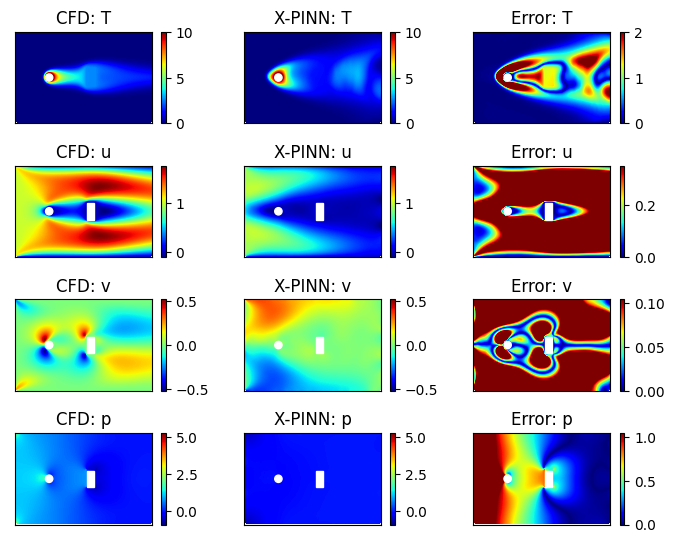

Epoch: 11500 Loss: 0.32578644 Loss1: 0.16343407 Loss2: 0.00004837


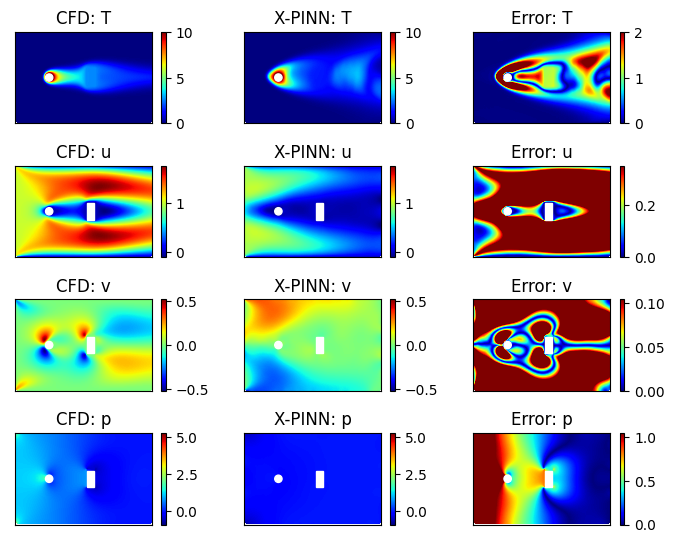

Epoch: 12000 Loss: 0.31083325 Loss1: 0.15572886 Loss2: 0.00012114


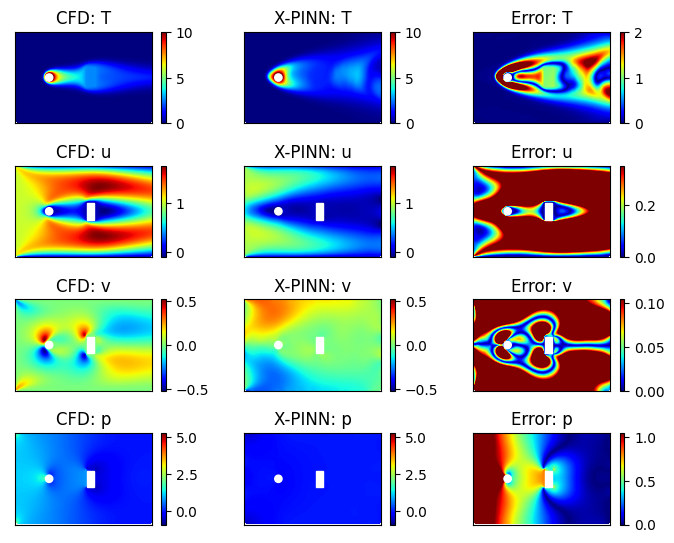

Epoch: 12500 Loss: 0.29042773 Loss1: 0.14662501 Loss2: 0.00005895


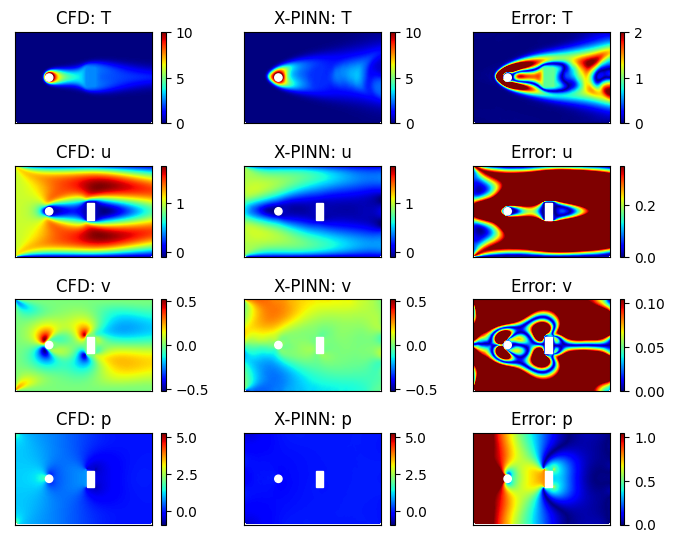

Epoch: 13000 Loss: 0.29731029 Loss1: 0.14912997 Loss2: 0.00004577


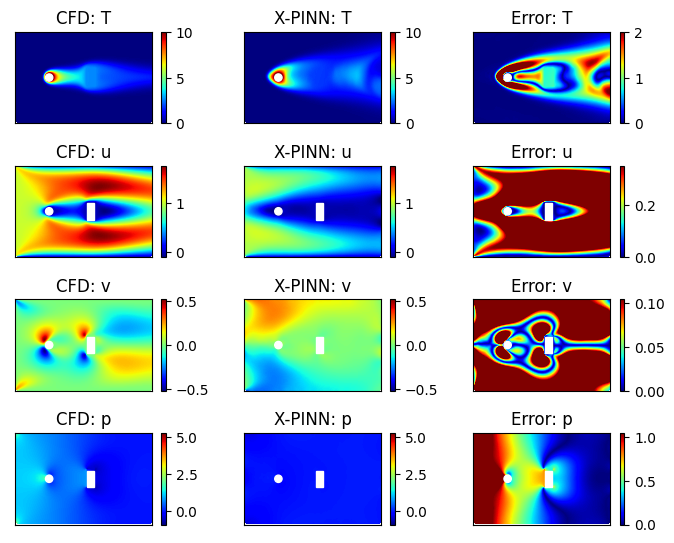

Epoch: 13500 Loss: 0.28358080 Loss1: 0.14221363 Loss2: 0.00004298


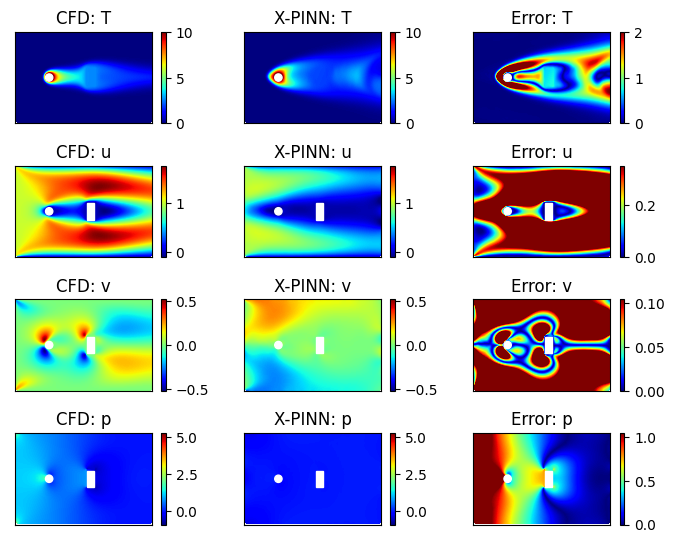

Epoch: 14000 Loss: 0.26319719 Loss1: 0.13162851 Loss2: 0.00004109


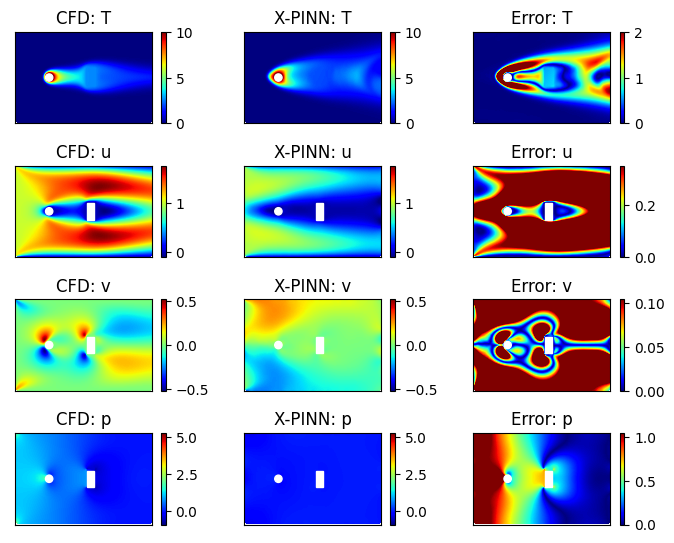

Epoch: 14500 Loss: 0.27637072 Loss1: 0.13766819 Loss2: 0.00006117


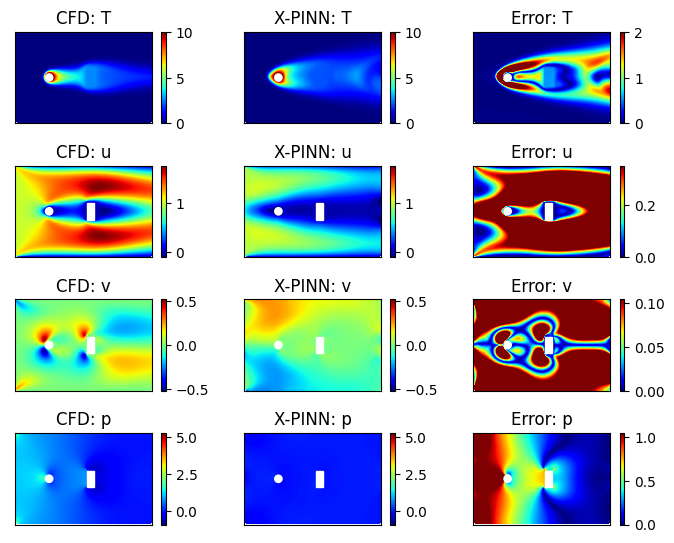

Epoch: 15000 Loss: 0.24499109 Loss1: 0.12248075 Loss2: 0.00004321


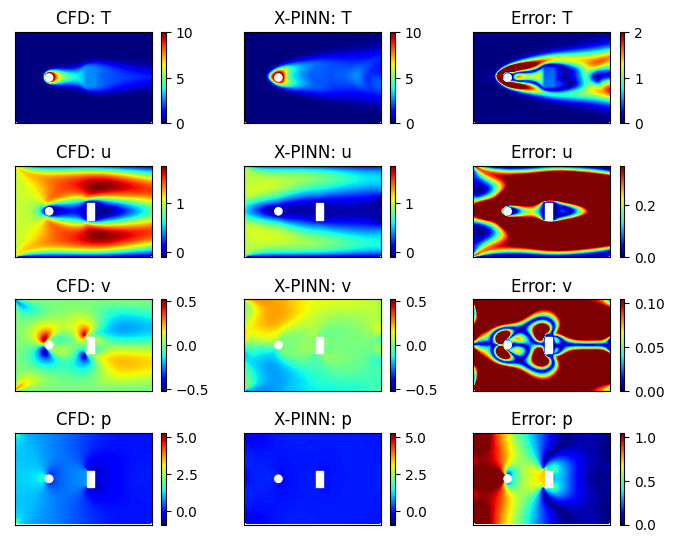

Epoch: 15500 Loss: 0.23894588 Loss1: 0.11913497 Loss2: 0.00004242


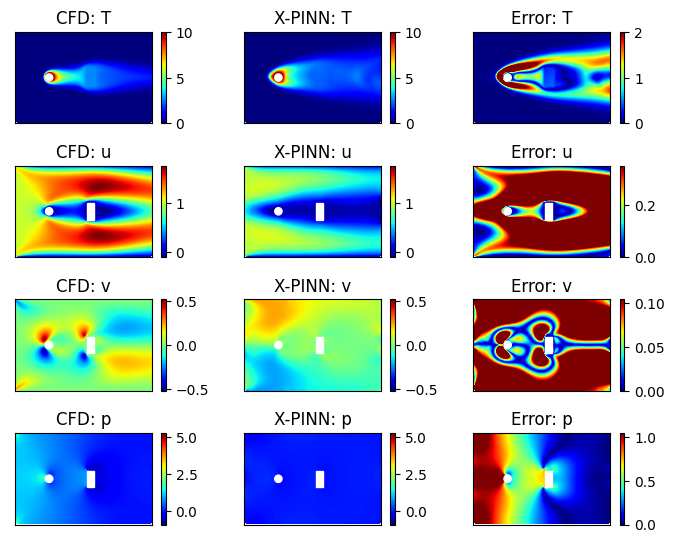

Epoch: 16000 Loss: 0.22582374 Loss1: 0.11274306 Loss2: 0.00006476


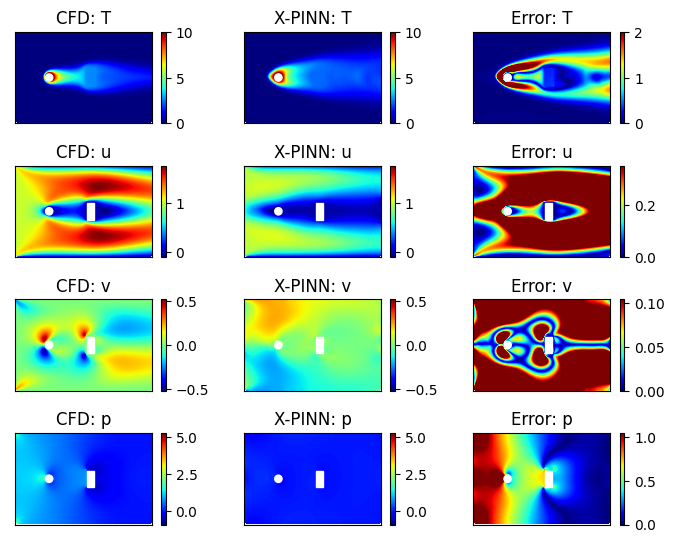

Epoch: 16500 Loss: 0.21928641 Loss1: 0.10948819 Loss2: 0.00005134


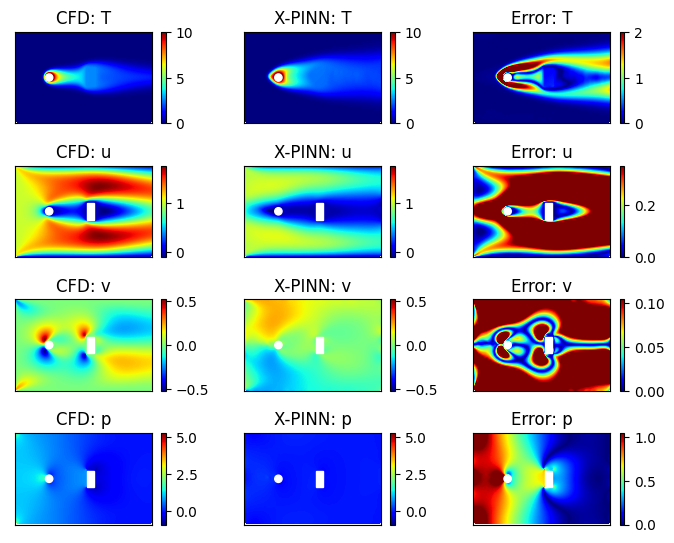

Epoch: 17000 Loss: 0.19733251 Loss1: 0.09856448 Loss2: 0.00005814


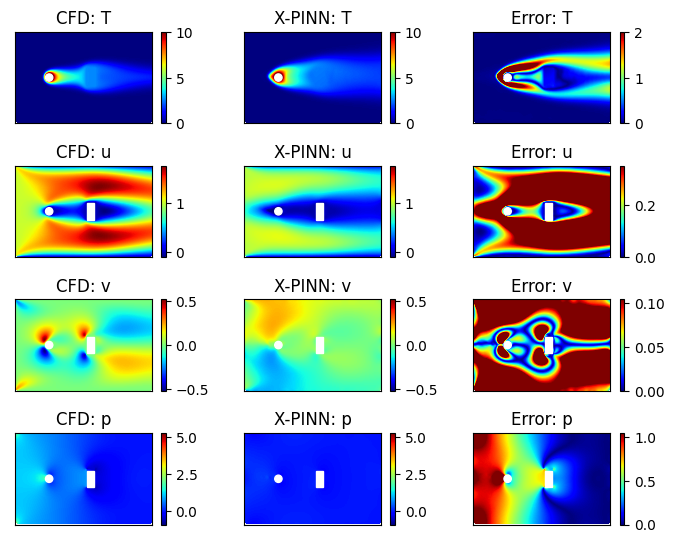

Epoch: 17500 Loss: 0.21451945 Loss1: 0.10662822 Loss2: 0.00008524


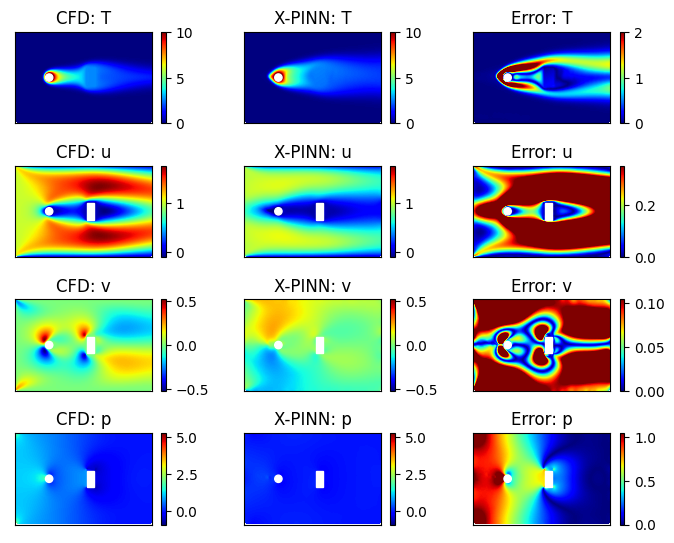

Epoch: 18000 Loss: 0.20922597 Loss1: 0.10361421 Loss2: 0.00009542


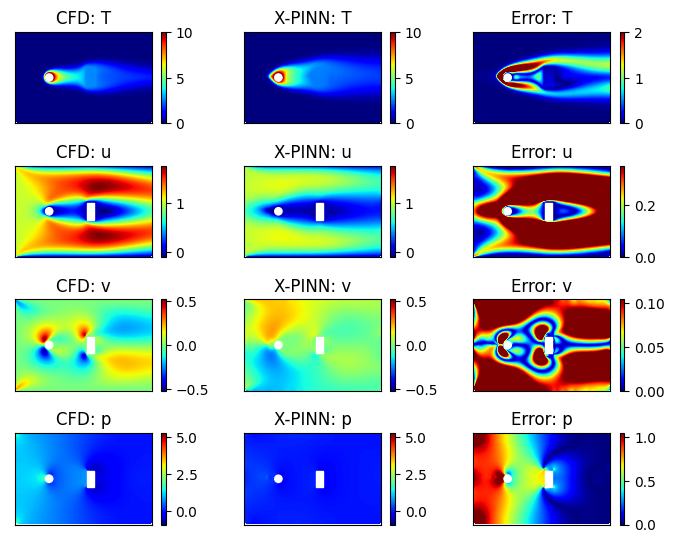

Epoch: 18500 Loss: 0.16248080 Loss1: 0.08086553 Loss2: 0.00009029


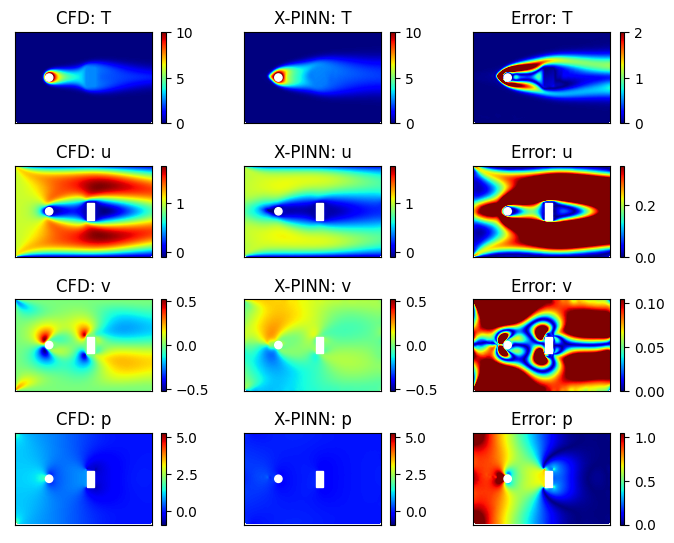

Epoch: 19000 Loss: 0.13673075 Loss1: 0.06888290 Loss2: 0.00012867


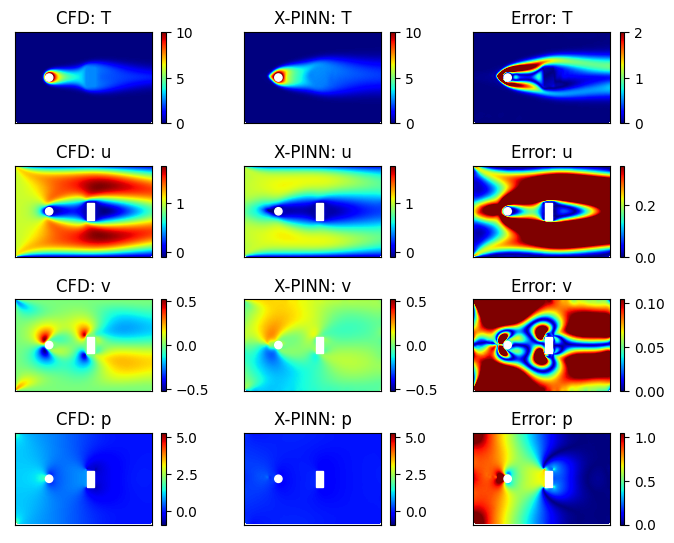

Epoch: 19500 Loss: 0.12556291 Loss1: 0.06196285 Loss2: 0.00012679


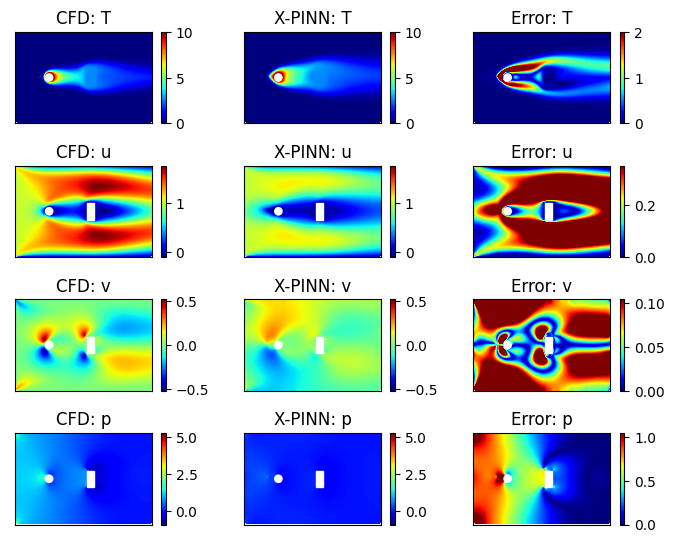

Epoch: 20000 Loss: 0.12940548 Loss1: 0.06460989 Loss2: 0.00010169


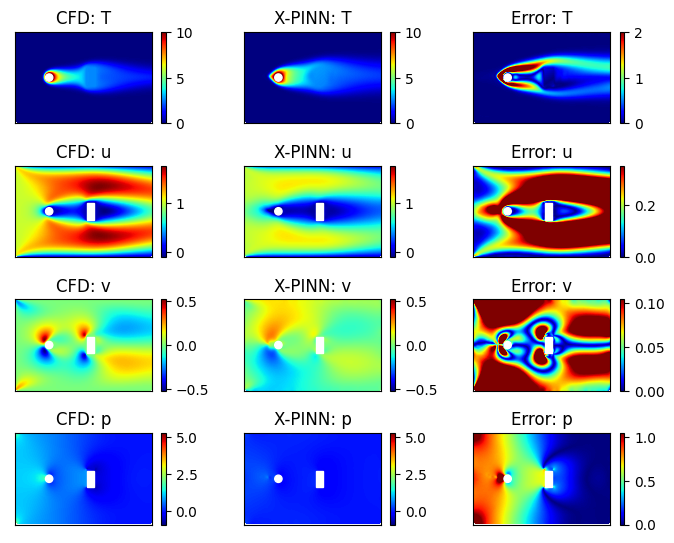

Epoch: 20500 Loss: 0.14230009 Loss1: 0.07421546 Loss2: 0.00012927


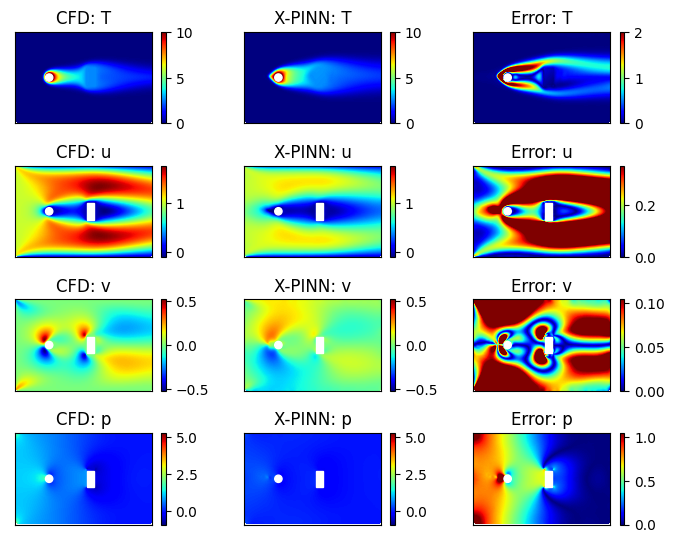

Epoch: 21000 Loss: 0.12149484 Loss1: 0.06114005 Loss2: 0.00011377


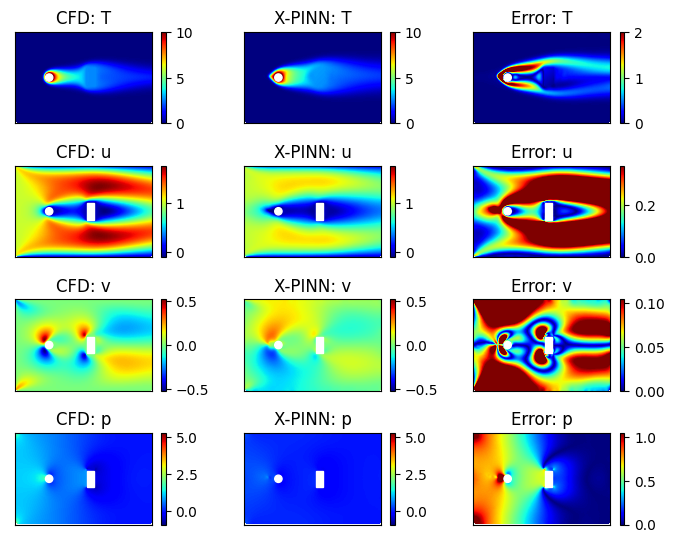

Epoch: 21500 Loss: 0.09989205 Loss1: 0.05051376 Loss2: 0.00009977


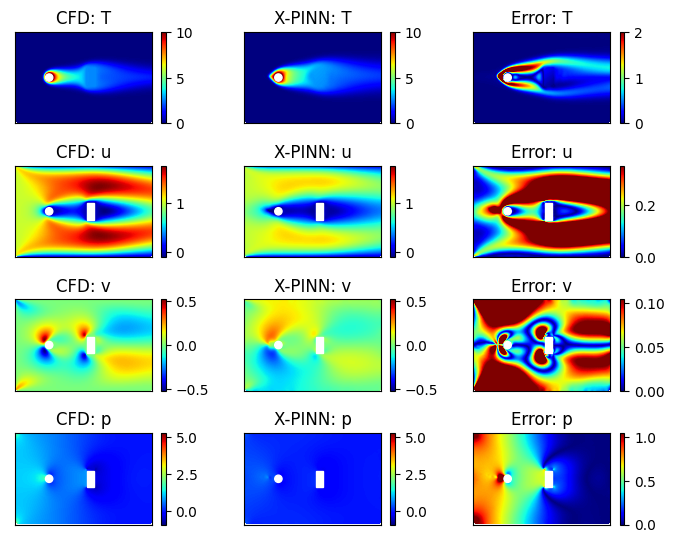

Epoch: 22000 Loss: 0.09409953 Loss1: 0.04733876 Loss2: 0.00009789


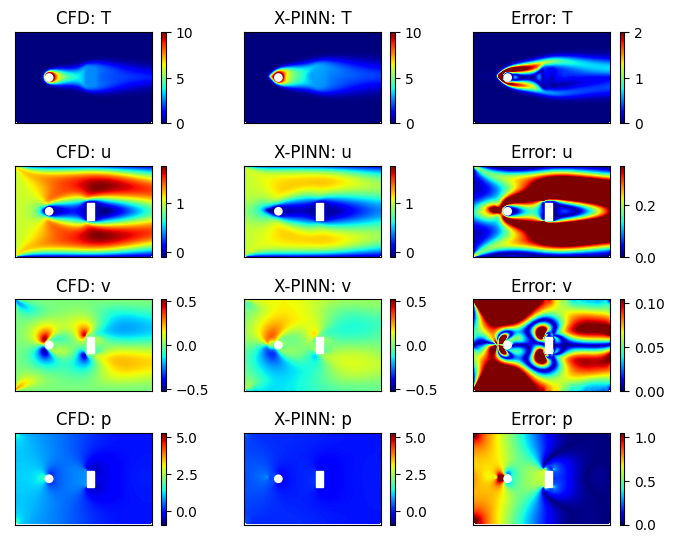

Epoch: 22500 Loss: 0.08782973 Loss1: 0.04391599 Loss2: 0.00019459


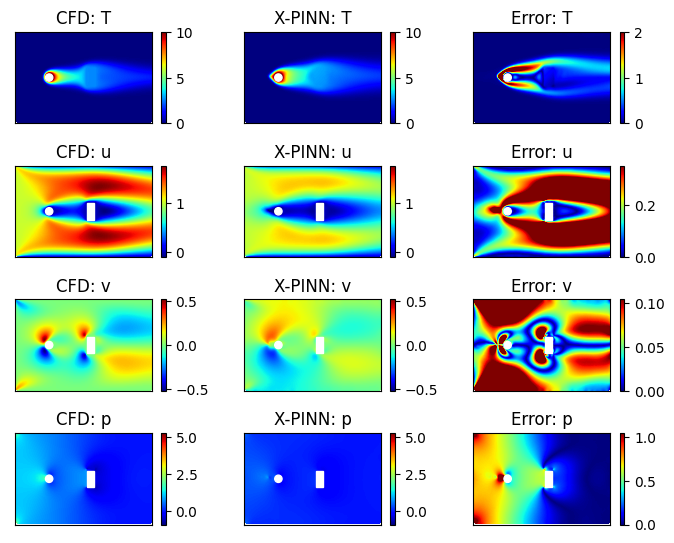

Epoch: 23000 Loss: 0.11270972 Loss1: 0.05705889 Loss2: 0.00010243


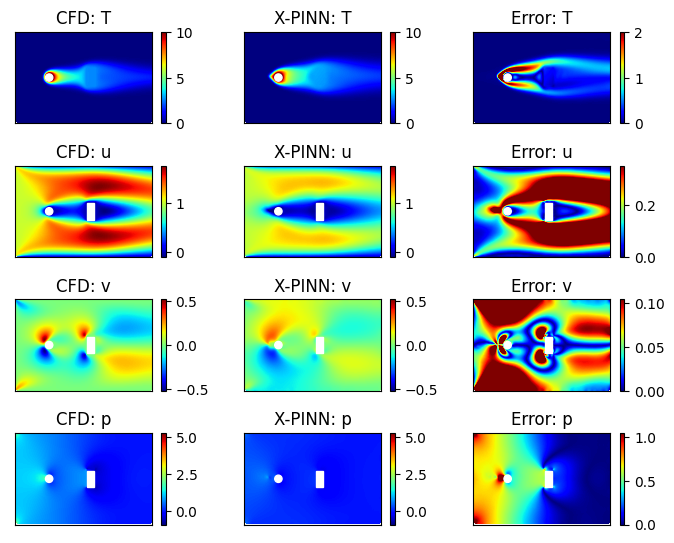

Epoch: 23500 Loss: 0.09192023 Loss1: 0.04589464 Loss2: 0.00009242


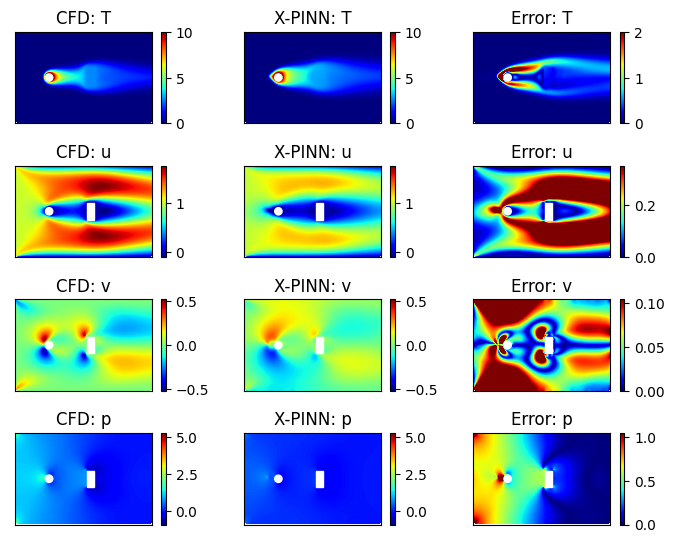

Epoch: 24000 Loss: 0.08602787 Loss1: 0.04270858 Loss2: 0.00007964


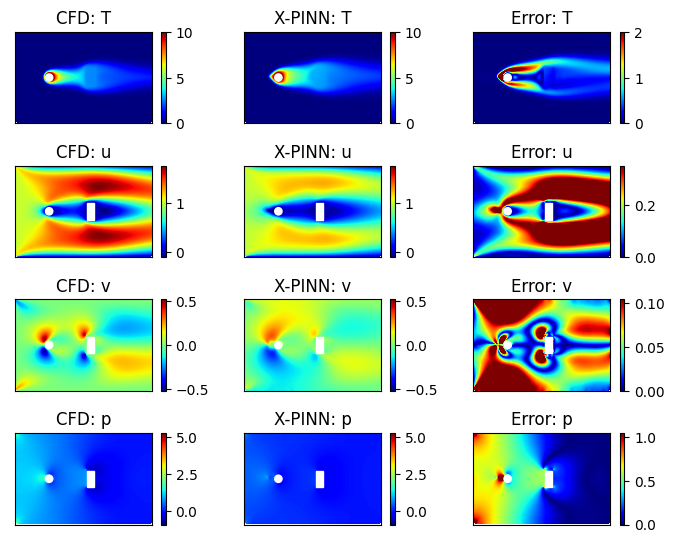

Epoch: 24500 Loss: 0.08826167 Loss1: 0.04514713 Loss2: 0.00007718


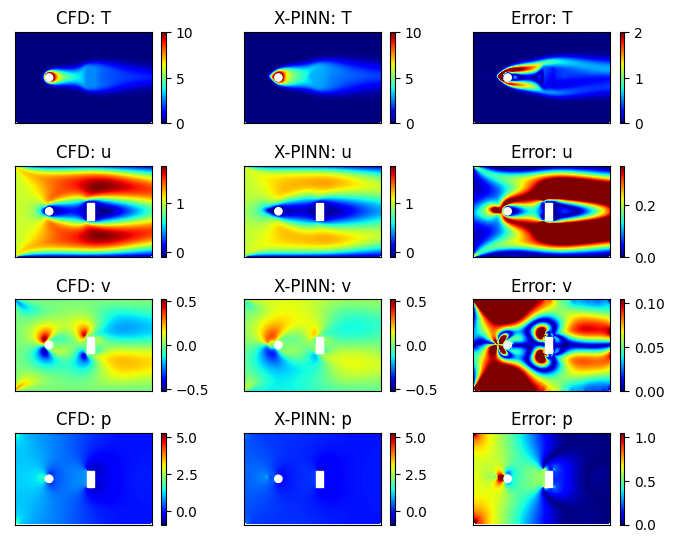

Epoch: 25000 Loss: 0.09448671 Loss1: 0.04709966 Loss2: 0.00008065


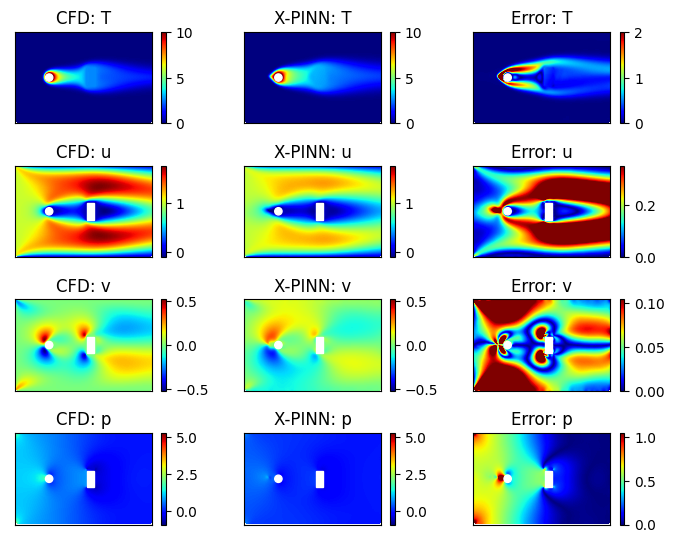

Epoch: 25500 Loss: 0.08448636 Loss1: 0.04256066 Loss2: 0.00007685


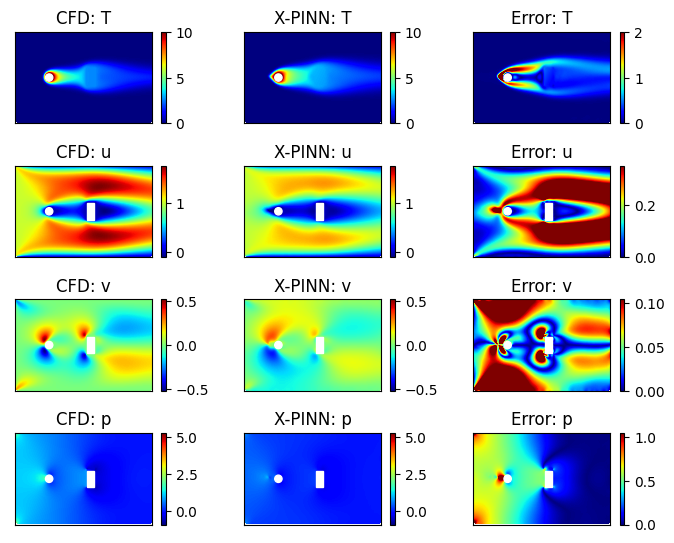

Epoch: 26000 Loss: 0.08645224 Loss1: 0.04130077 Loss2: 0.00008521


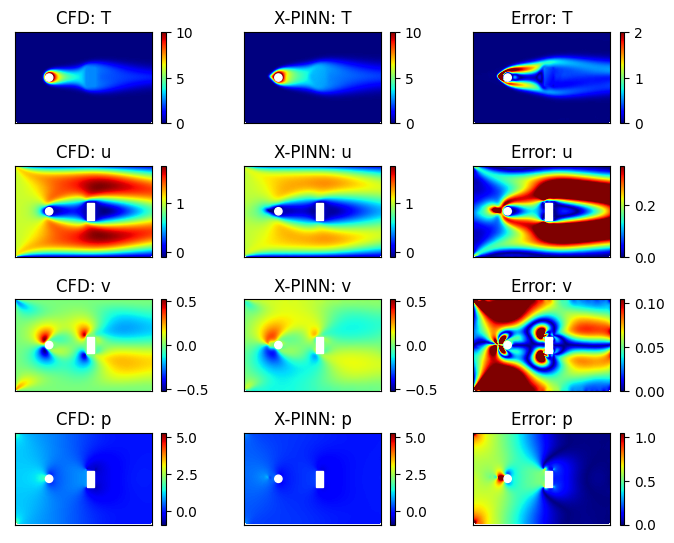

Epoch: 26500 Loss: 0.07731689 Loss1: 0.03862022 Loss2: 0.00006003


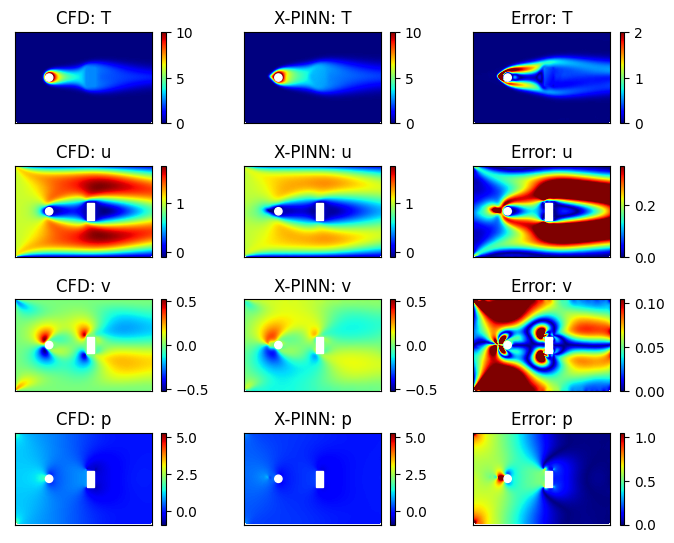

Epoch: 27000 Loss: 0.07536602 Loss1: 0.03791699 Loss2: 0.00006150


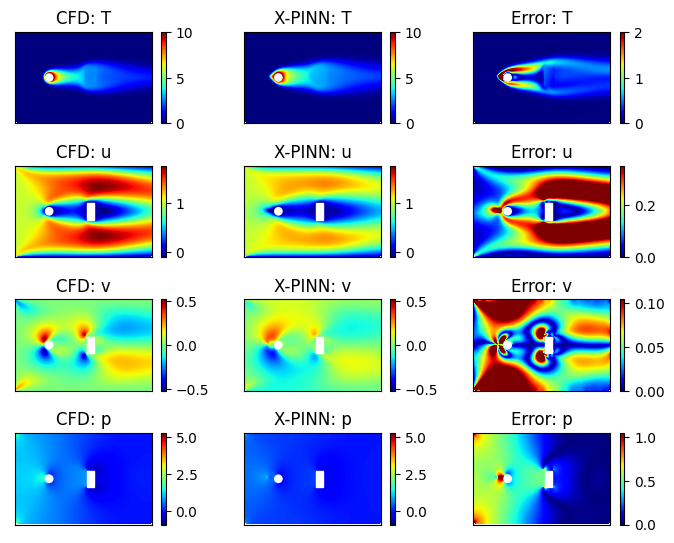

Epoch: 27500 Loss: 0.07313003 Loss1: 0.03695461 Loss2: 0.00012562


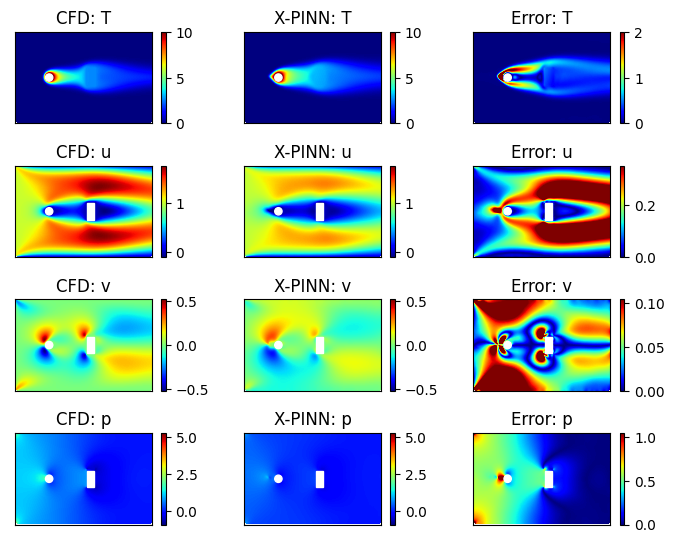

Epoch: 28000 Loss: 0.08831213 Loss1: 0.04414576 Loss2: 0.00007156


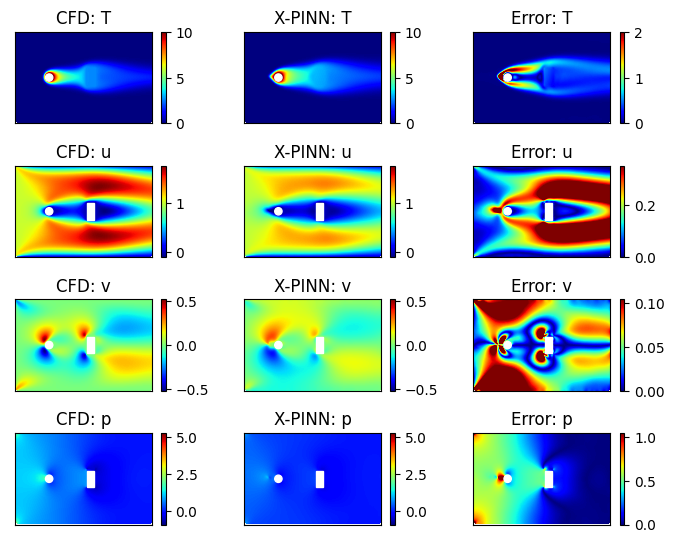

Epoch: 28500 Loss: 0.06788349 Loss1: 0.03443020 Loss2: 0.00006056


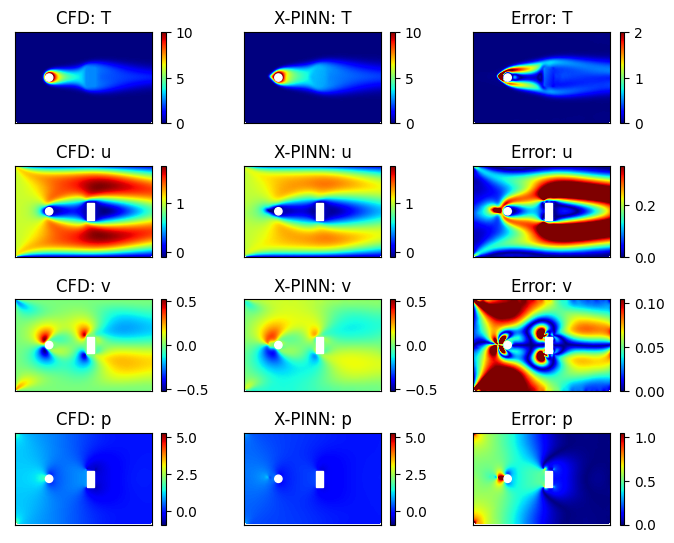

Epoch: 29000 Loss: 0.10011178 Loss1: 0.05142967 Loss2: 0.00005331


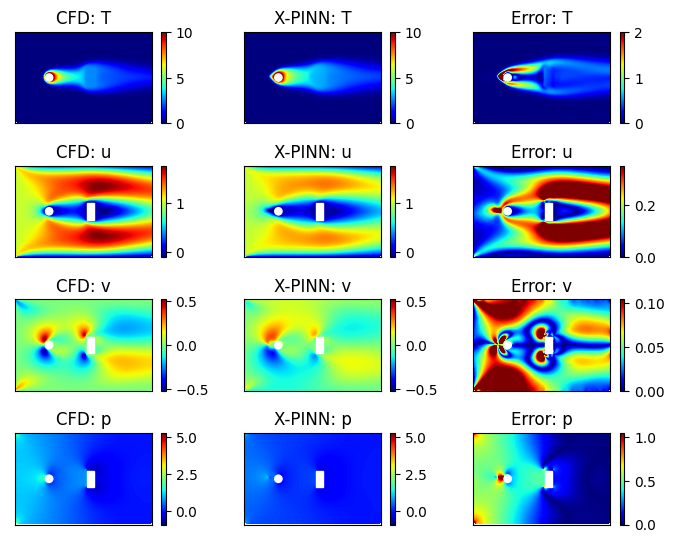

Epoch: 29500 Loss: 0.07895301 Loss1: 0.03924335 Loss2: 0.00005528


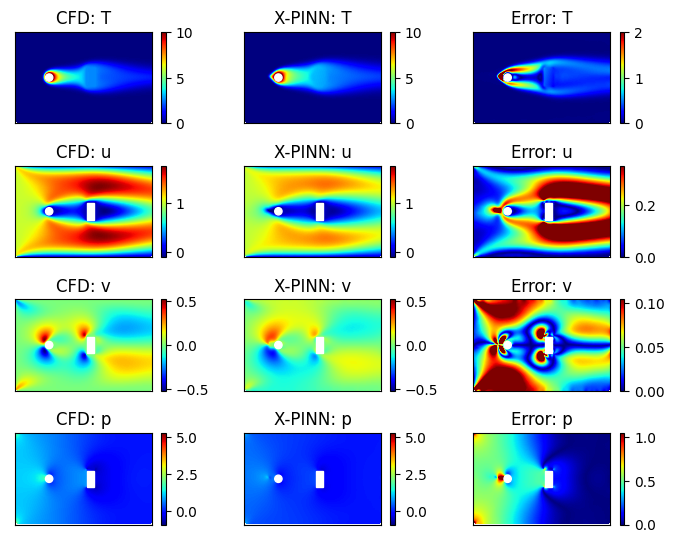

Epoch: 30000 Loss: 0.08746561 Loss1: 0.04383568 Loss2: 0.00006825


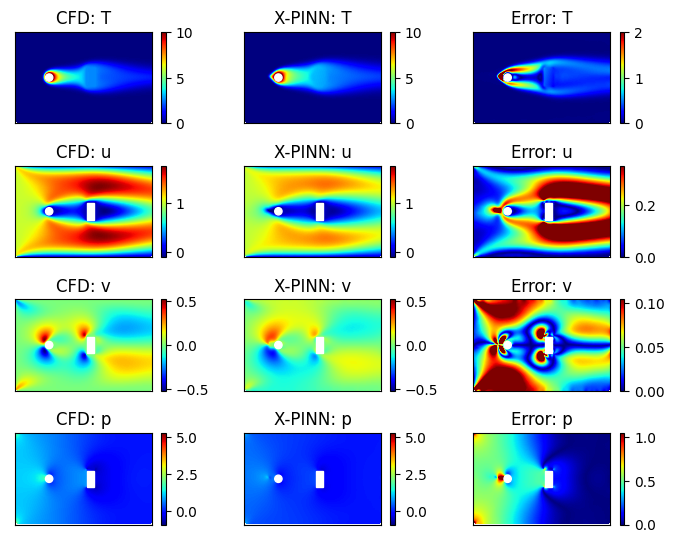

Epoch: 30500 Loss: 0.07344197 Loss1: 0.03637730 Loss2: 0.00006036


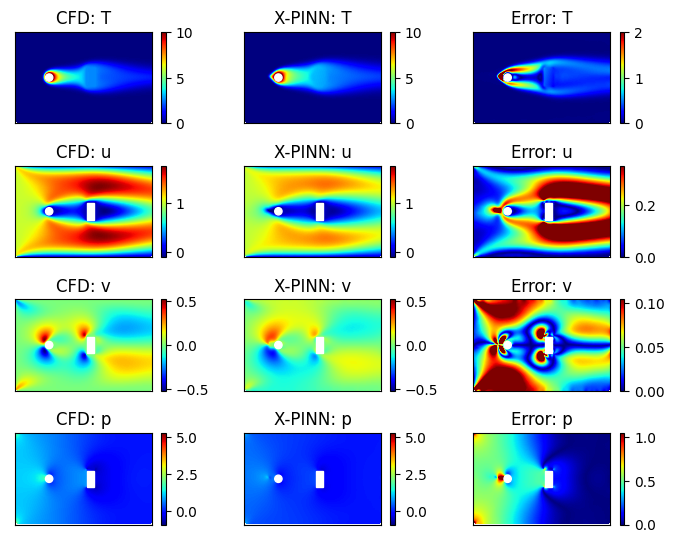

Epoch: 31000 Loss: 0.07477247 Loss1: 0.03740569 Loss2: 0.00005002


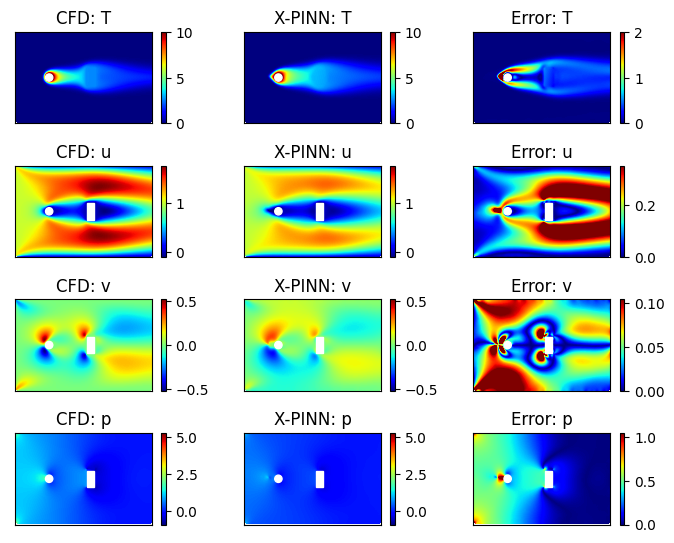

Epoch: 31500 Loss: 0.06669625 Loss1: 0.03352403 Loss2: 0.00009694


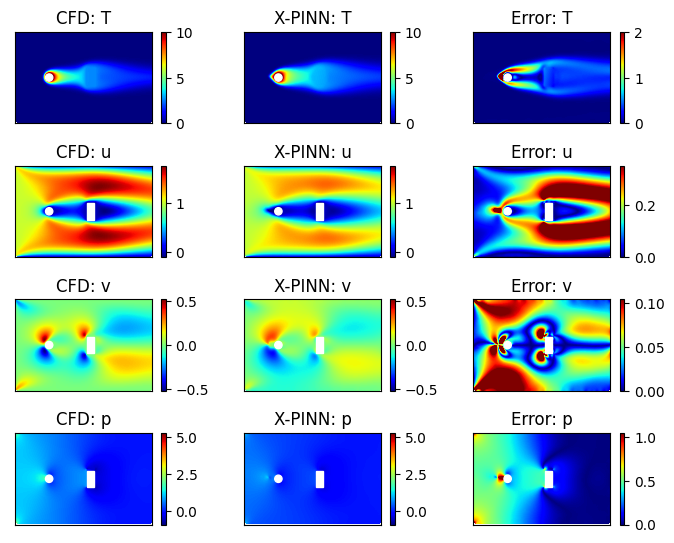

Epoch: 32000 Loss: 0.06199508 Loss1: 0.03019008 Loss2: 0.00005819


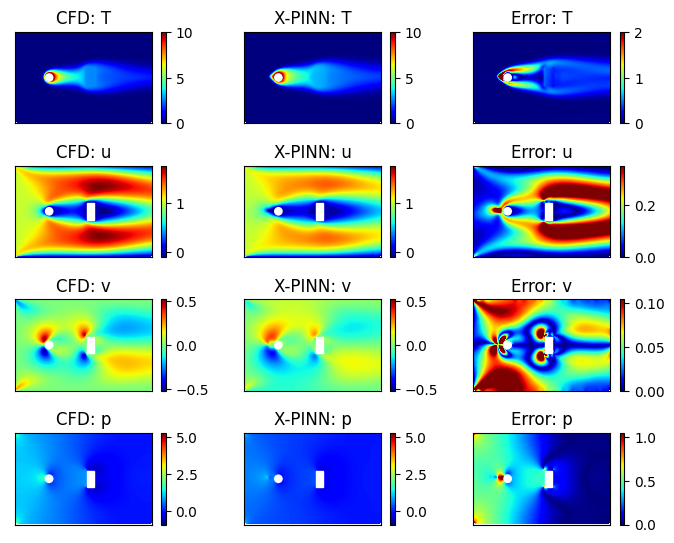

Epoch: 32500 Loss: 0.07619779 Loss1: 0.03728179 Loss2: 0.00006358


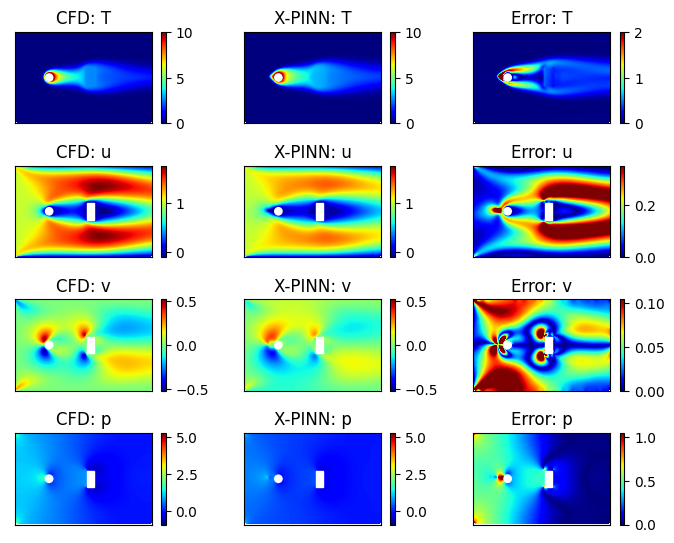

Epoch: 33000 Loss: 0.07302496 Loss1: 0.03830322 Loss2: 0.00005708


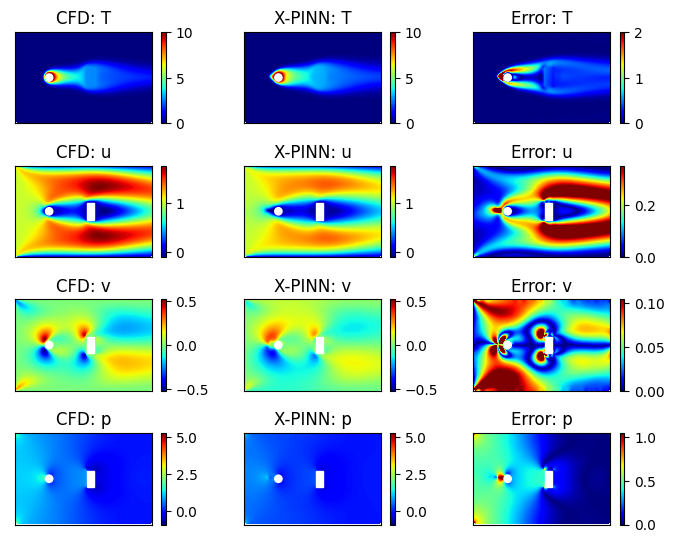

Epoch: 33500 Loss: 0.06732824 Loss1: 0.03285255 Loss2: 0.00005058


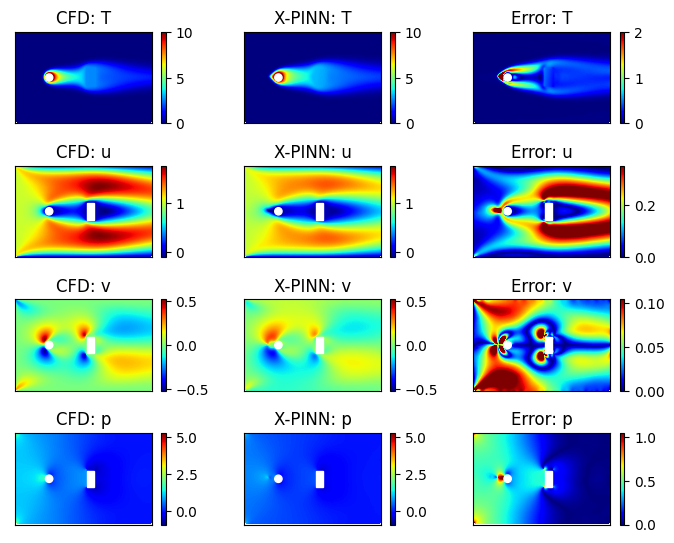

Epoch: 34000 Loss: 0.06551081 Loss1: 0.03215193 Loss2: 0.00007239


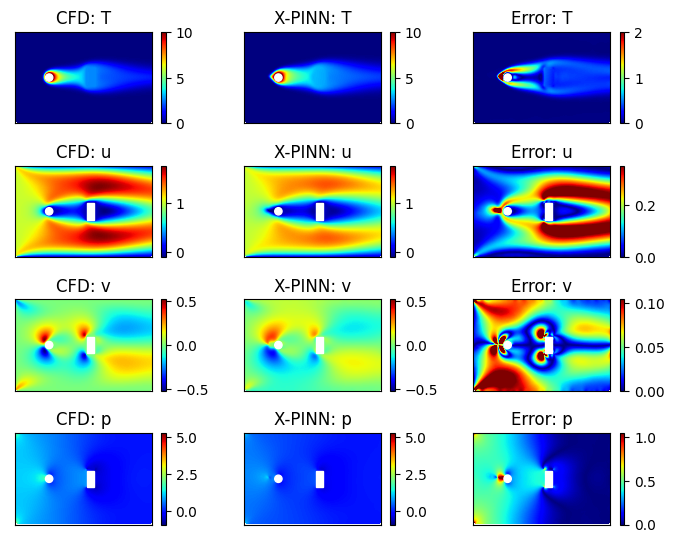

Epoch: 34500 Loss: 0.05760857 Loss1: 0.02908969 Loss2: 0.00005769


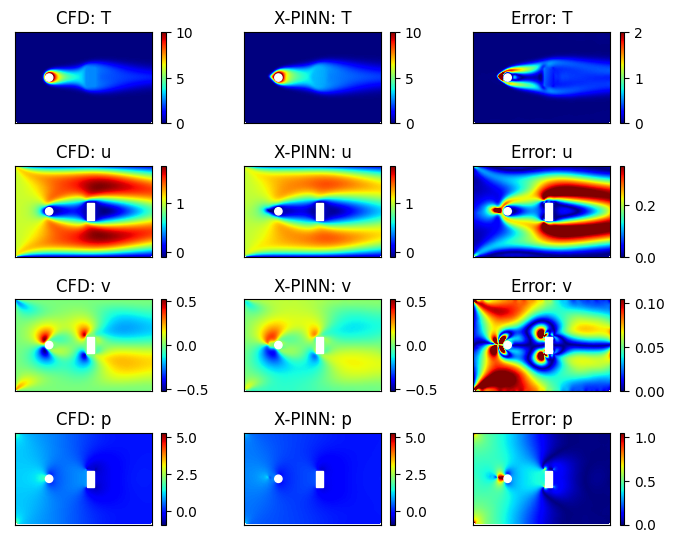

Epoch: 35000 Loss: 0.06479922 Loss1: 0.03299759 Loss2: 0.00005169


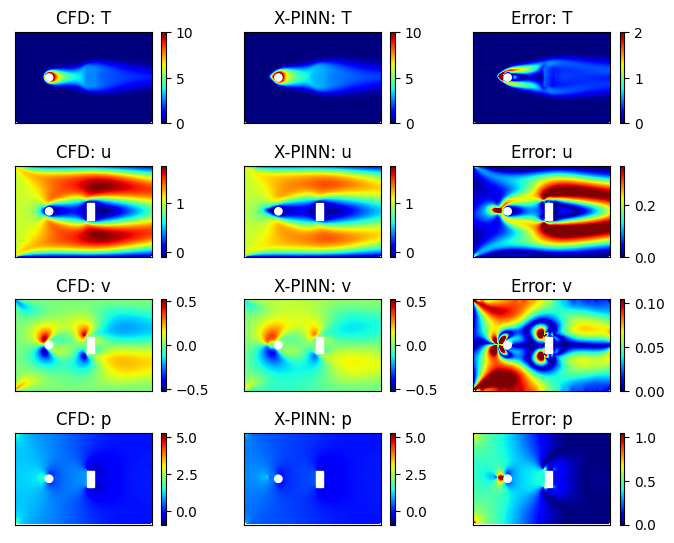

Epoch: 35500 Loss: 0.06524140 Loss1: 0.03175289 Loss2: 0.00004627


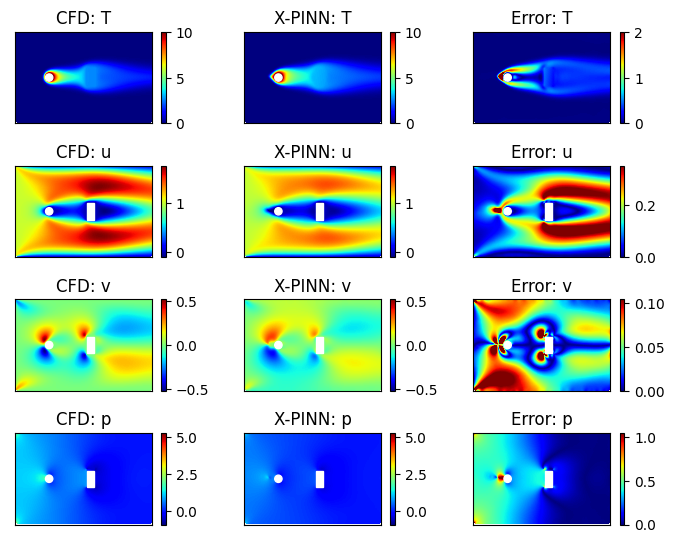

Epoch: 36000 Loss: 0.07146881 Loss1: 0.03447781 Loss2: 0.00004805


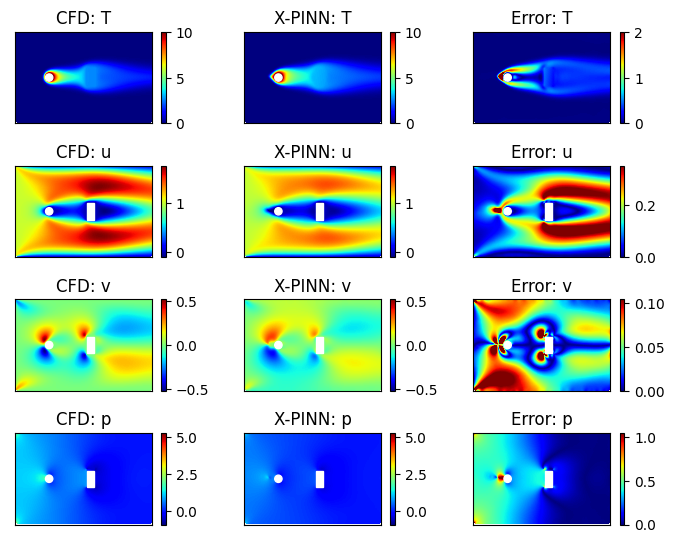

Epoch: 36500 Loss: 0.05959035 Loss1: 0.02911211 Loss2: 0.00005403


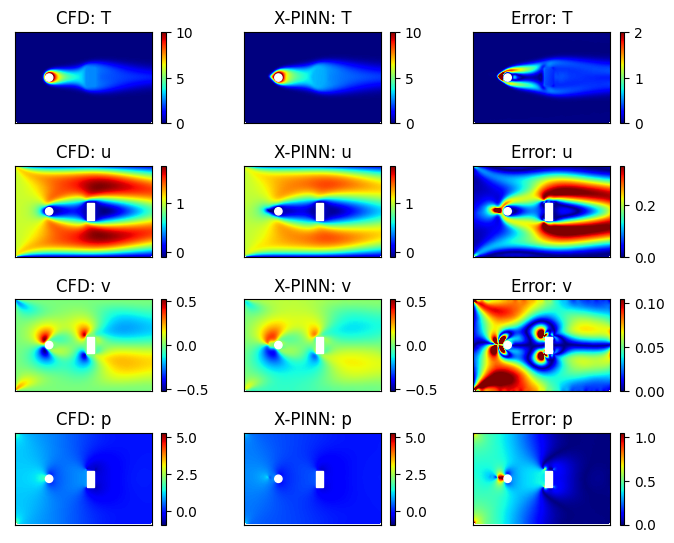

Epoch: 37000 Loss: 0.05761418 Loss1: 0.02828872 Loss2: 0.00005809


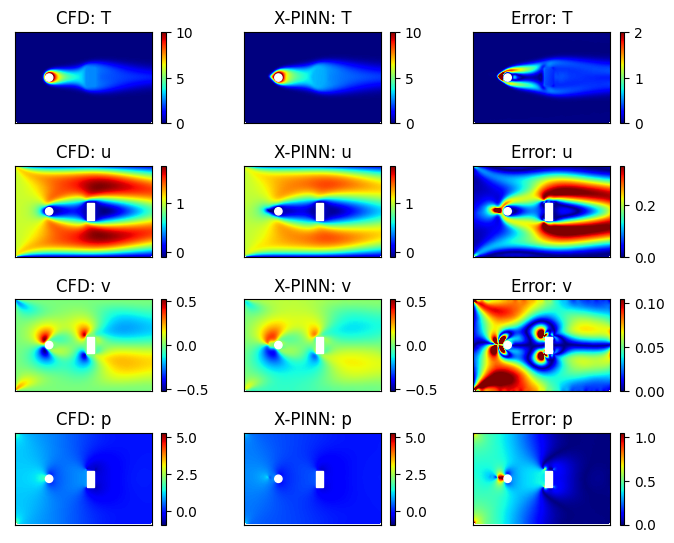

Epoch: 37500 Loss: 0.05107218 Loss1: 0.02601812 Loss2: 0.00004396


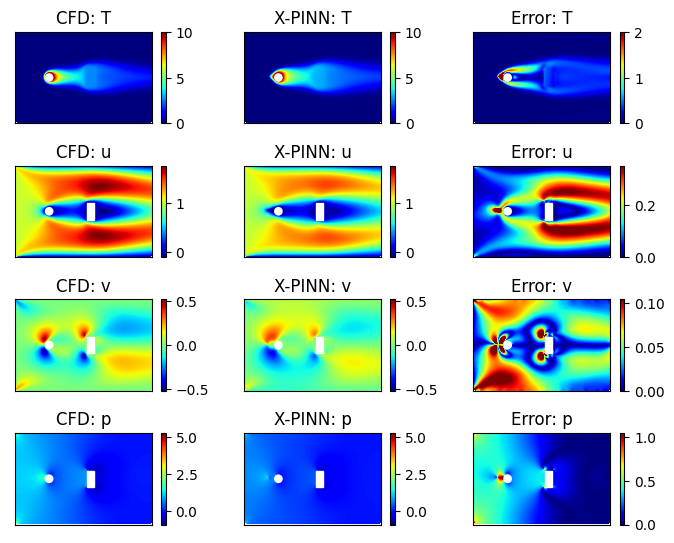

Epoch: 38000 Loss: 0.05617865 Loss1: 0.02830339 Loss2: 0.00015435


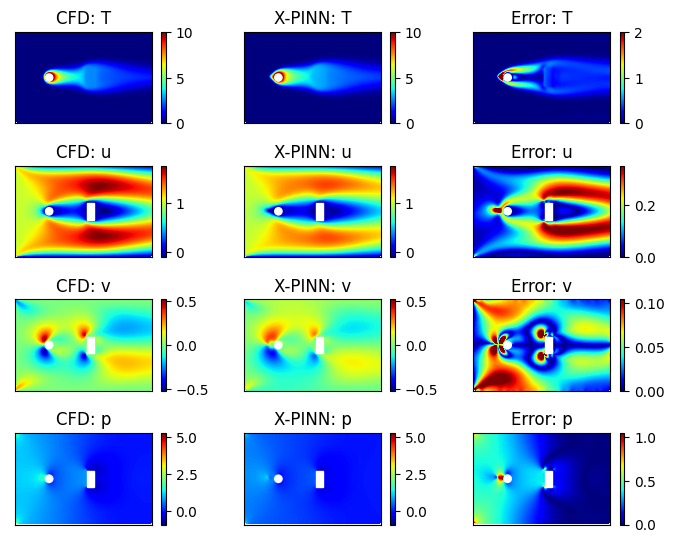

Epoch: 38500 Loss: 0.06232860 Loss1: 0.03045906 Loss2: 0.00007926


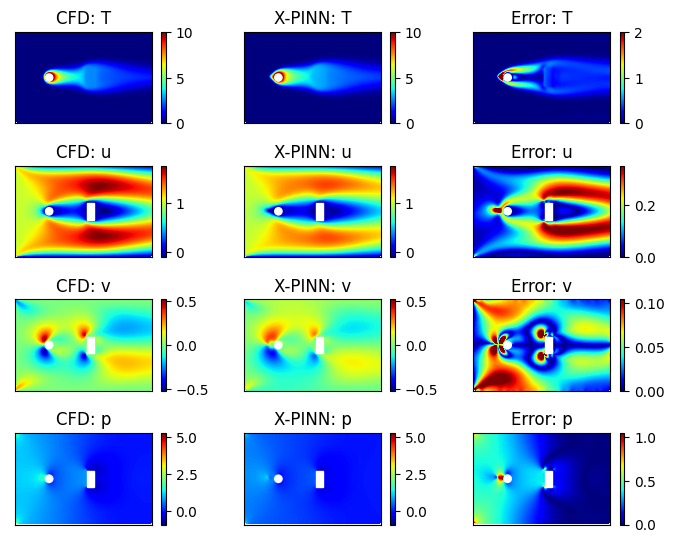

Epoch: 39000 Loss: 0.05707184 Loss1: 0.02768997 Loss2: 0.00005144


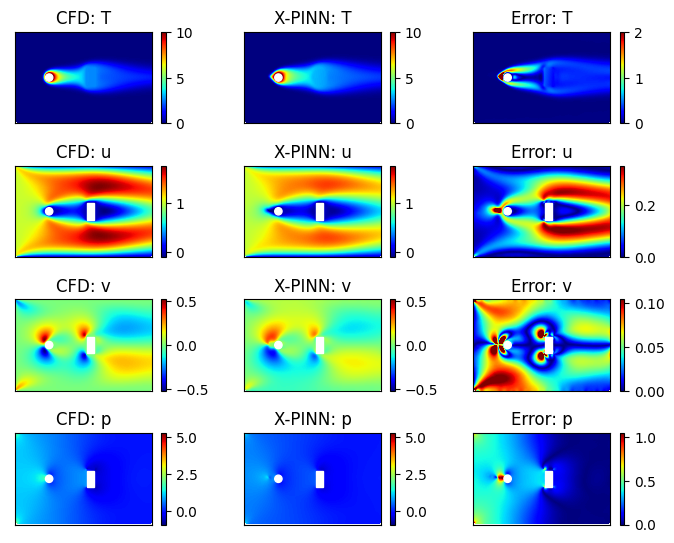

In [ ]:
while epoch < 150001:
    Loss_PDE_F = PDE_F(model1, collocation_points)  
    Loss_BC = BC(model1, collocation_points, inlet)
    Loss_SB = SB(model1, model2, collocation_points, 1)

    Loss_PDE_F_u = Loss_func(Loss_PDE_F[0].float(), torch.zeros_like(Loss_PDE_F[0]).to(device))
    Loss_PDE_F_v = Loss_func(Loss_PDE_F[1].float(), torch.zeros_like(Loss_PDE_F[1]).to(device))
    Loss_PDE_F_cont = Loss_func(Loss_PDE_F[2].float(), torch.zeros_like(Loss_PDE_F[2]).to(device)) 
    Loss_PDE_F_convection = Loss_func(Loss_PDE_F[3].float(), torch.zeros_like(Loss_PDE_F[3]).to(device)) 

    loss_pde_f = Loss_PDE_F_u + Loss_PDE_F_v + Loss_PDE_F_cont + Loss_PDE_F_convection
    
    Loss_BC_top = Loss_func(Loss_BC[0].float(), torch.zeros_like(Loss_BC[0]).to(device))
    Loss_BC_top_T = Loss_func(Loss_BC[1].float(), torch.zeros_like(Loss_BC[1]).to(device))
    Loss_BC_bottom = Loss_func(Loss_BC[2].float(), torch.zeros_like(Loss_BC[2]).to(device))
    Loss_BC_bottom_T = Loss_func(Loss_BC[3].float(), torch.zeros_like(Loss_BC[3]).to(device))
    Loss_BC_left_u = Loss_func(Loss_BC[4].float(), torch.zeros_like(Loss_BC[4]).to(device))
    Loss_BC_left_v = Loss_func(Loss_BC[5].float(), torch.zeros_like(Loss_BC[5]).to(device))
    Loss_BC_left_T = Loss_func(Loss_BC[6].float(), torch.zeros_like(Loss_BC[6]).to(device))
    Loss_BC_right = Loss_func(Loss_BC[7].float(), torch.zeros_like(Loss_BC[7]).to(device))
    Loss_BC_right_dT_x = Loss_func(Loss_BC[8].float(), torch.zeros_like(Loss_BC[8]).to(device))
    BC_cylinder = Loss_func(Loss_BC[9].float(), torch.zeros_like(Loss_BC[9]).to(device))
    BC_cylinder_T = Loss_func(Loss_BC[10].float(), torch.zeros_like(Loss_BC[10]).to(device))
    BC_saga = Loss_func(Loss_BC[11].float(), torch.zeros_like(Loss_BC[11]).to(device))
    
    loss_bc =  Loss_BC_top + Loss_BC_top_T + Loss_BC_bottom + Loss_BC_bottom_T + Loss_BC_left_u + Loss_BC_left_v + Loss_BC_left_T + \
               Loss_BC_right + Loss_BC_right_dT_x + BC_cylinder + BC_cylinder_T + BC_saga
    
    Loss_SB_PDE_T1 = Loss_func(Loss_SB[0].float(), torch.zeros_like(Loss_SB[0]).to(device))  
    Loss_SB_T1I1 = Loss_func(Loss_SB[2].float(), torch.zeros_like(Loss_SB[2]).to(device))
    
    loss1 = loss_pde_f + loss_bc + Loss_SB_PDE_T1 + Loss_SB_T1I1
    
    optimizer1.zero_grad()
    loss1.backward()
    optimizer1.step()
    
    Loss_SB = SB(model1, model2, collocation_points, 2)
    
    Loss_SB_T2I1 = Loss_func(Loss_SB[3].float(), torch.zeros_like(Loss_SB[3]).to(device))
    
    loss2 = Loss_SB_T2I1
    
    optimizer2.zero_grad()
    loss2.backward()
    optimizer2.step()
    
    Loss_SB = SB(model1, model2, collocation_points, 2)
    
    Loss_SB_PDE_T2 = Loss_func(Loss_SB[1].float(), torch.zeros_like(Loss_SB[1]).to(device))
    
    loss3 = 100 * Loss_SB_PDE_T2
    
    optimizer2.zero_grad()
    loss3.backward()
    optimizer2.step()
    
    Loss_PDE_S = PDE_S(model2, collocation_points)
    
    Loss_PDF_S_conduction = Loss_func(Loss_PDE_S[0].float(), torch.zeros_like(Loss_PDE_S[0]).to(device))
    
    loss4 = 100 * Loss_PDF_S_conduction
    
    optimizer2.zero_grad()
    loss4.backward()
    optimizer2.step()
    
    Loss_PDE_F = PDE_F(model1, collocation_points)  
    Loss_BC = BC(model1, collocation_points, inlet)
    Loss_SB = SB(model1, model2, collocation_points, 1)

    Loss_PDE_F_u = Loss_func(Loss_PDE_F[0].float(), torch.zeros_like(Loss_PDE_F[0]).to(device))
    Loss_PDE_F_v = Loss_func(Loss_PDE_F[1].float(), torch.zeros_like(Loss_PDE_F[1]).to(device))
    Loss_PDE_F_cont = Loss_func(Loss_PDE_F[2].float(), torch.zeros_like(Loss_PDE_F[2]).to(device)) 
    Loss_PDE_F_convection = Loss_func(Loss_PDE_F[3].float(), torch.zeros_like(Loss_PDE_F[3]).to(device)) 

    loss_pde_f = Loss_PDE_F_u + Loss_PDE_F_v + Loss_PDE_F_cont + Loss_PDE_F_convection
    
    Loss_BC_top = Loss_func(Loss_BC[0].float(), torch.zeros_like(Loss_BC[0]).to(device))
    Loss_BC_top_T = Loss_func(Loss_BC[1].float(), torch.zeros_like(Loss_BC[1]).to(device))
    Loss_BC_bottom = Loss_func(Loss_BC[2].float(), torch.zeros_like(Loss_BC[2]).to(device))
    Loss_BC_bottom_T = Loss_func(Loss_BC[3].float(), torch.zeros_like(Loss_BC[3]).to(device))
    Loss_BC_left_u = Loss_func(Loss_BC[4].float(), torch.zeros_like(Loss_BC[4]).to(device))
    Loss_BC_left_v = Loss_func(Loss_BC[5].float(), torch.zeros_like(Loss_BC[5]).to(device))
    Loss_BC_left_T = Loss_func(Loss_BC[6].float(), torch.zeros_like(Loss_BC[6]).to(device))
    Loss_BC_right = Loss_func(Loss_BC[7].float(), torch.zeros_like(Loss_BC[7]).to(device))
    Loss_BC_right_dT_x = Loss_func(Loss_BC[8].float(), torch.zeros_like(Loss_BC[8]).to(device))
    BC_cylinder = Loss_func(Loss_BC[9].float(), torch.zeros_like(Loss_BC[9]).to(device))
    BC_cylinder_T = Loss_func(Loss_BC[10].float(), torch.zeros_like(Loss_BC[10]).to(device))
    BC_saga = Loss_func(Loss_BC[11].float(), torch.zeros_like(Loss_BC[11]).to(device))
    
    loss_bc =  Loss_BC_top + Loss_BC_top_T + Loss_BC_bottom + Loss_BC_bottom_T + Loss_BC_left_u + Loss_BC_left_v + Loss_BC_left_T + \
               Loss_BC_right + Loss_BC_right_dT_x + BC_cylinder + BC_cylinder_T + BC_saga
    
    Loss_SB_PDE_T1 = Loss_func(Loss_SB[0].float(), torch.zeros_like(Loss_SB[0]).to(device))  
    Loss_SB_T1I1 = Loss_func(Loss_SB[2].float(), torch.zeros_like(Loss_SB[2]).to(device))
    
    loss5 = loss_pde_f + loss_bc + Loss_SB_PDE_T1 + Loss_SB_T1I1
    
    optimizer1.zero_grad()
    loss5.backward()
    optimizer1.step()
    
    loss_total = loss1.item() + loss2.item() + loss3.item() + loss4.item() + loss5.item()
    loss_model1 = loss1.item() + loss5.item()
    loss_model2 = loss2.item() + loss3.item() + loss4.item()
    
    if loss_total < max_loss:
        torch.save(model1, './weights/facc_pinn_v5_01/v5_5_model1.pt')
        torch.save(model2, './weights/facc_pinn_v5_01/v5_5_model2.pt')
        max_loss = loss_total

    if epoch % 500 == 0:
        with torch.no_grad():
            model1_test = torch.load('./weights/facc_pinn_v5_01/v5_5_model1.pt')
            model2_test = torch.load('./weights/facc_pinn_v5_01/v5_5_model2.pt')
            print('Epoch: {} Loss: {:.8f} Loss1: {:.8f} Loss2: {:.8f}'.format(epoch, loss_total, loss1.item(), loss2.item()))
            PLOT(model1_test, model2_test, cor_fluid, cor_saga, CFD_results_fluid, CFD_results_saga, epoch, history=False)
    epoch += 1

In [ ]:
# T1_pred_history = np.asarray(T1_pred_history)
# T2_pred_history = np.asarray(T2_pred_history)
# u_pred_history = np.asarray(u_pred_history)
# v_pred_history = np.asarray(v_pred_history)
# p_pred_history = np.asarray(p_pred_history)

# np.save('./weights/facc_pinn_v5_01/T1_pred_history.npy', T1_pred_history)
# np.save('./weights/facc_pinn_v5_01/T2_pred_history.npy', T2_pred_history)
# np.save('./weights/facc_pinn_v5_01/u_pred_history.npy', u_pred_history)
# np.save('./weights/facc_pinn_v5_01/v_pred_history.npy', v_pred_history)
# np.save('./weights/facc_pinn_v5_01/p_pred_history.npy', p_pred_history)